In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

%matplotlib notebook
import matplotlib as mpl
import matplotlib.pyplot as pl
import numpy as np
import os
import sys
import math
from datetime import datetime
import time
import pandas as pd
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import scipy
from scipy.optimize import curve_fit
#import sympy as sp
from scipy import stats  

#from labellines import labelLine, labelLines
from matplotlib.lines import Line2D

from scipy.optimize import curve_fit, leastsq

def linear (x,a,b):
    return (a*x)+b

def gaussian(x, mu, sig, A):
    return A*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
#g =  gaussian(np.linspace(-100, 100, 2000),0.0,10.0)

def bimodal(x,mu1,sigma1,A1,mu2,sigma2,A2):
    return gaussian(x,mu1,sigma1,A1)+gaussian(x,mu2,sigma2,A2)


def defl_cont(x,x_am,x_ch,mu1,sig1,A1,tau,A3,mu2,sig2,A2):
    return np.piecewise(x, [(x < x_am) , (x > x_am) & (x < x_ch) , (x > x_ch)], [lambda x: A1*np.exp(-np.power(x - mu1, 2.) / (2 * np.power(sig1, 2.))), 
                                                                                 lambda x: A1*np.exp(-np.power(x_am - mu1, 2.) / (2 * np.power(sig1, 2.))) +
                                                                                           A3*(np.exp(-x/tau) - np.exp(-x_am/tau))+
                                                                                           A2*(np.exp(-np.power(x_ch - mu2, 2.) / (2 * np.power(sig2, 2.)))),
                                                                                 lambda x: A1*np.exp(-np.power(x_am - mu1, 2.) / (2 * np.power(sig1, 2.))) +
                                                                                           A3*(np.exp(-x_ch/tau) - np.exp(-x_am/tau)) + 
                                                                                           #A2*(np.exp(-np.power(x - mu2, 2.) / (2 * np.power(sig2, 2.)) - np.exp(-np.power(x_ch - mu2, 2.) / (2 * np.power(sig2, 2.)))))])
                                                                                           A2*(np.exp(-np.power(x - mu2, 2.) / (2 * np.power(sig2, 2.))))])

# Data Loading


In [2]:
mpl.rcParams['font.size'] = 14
####################### Definition of variables
crit_angle = 12     #### critical angle 12
cry_length = 2e-3    #### crystal length
t = 0                #### torsion parameter initialisation
o = 0                #### torsionoffset initialisation

energy = 180
critical_angle = 10.*np.sqrt(400./energy)
print(critical_angle)
critical_angle = 18

14.907119849998598


In [3]:
####################### Dataframe loading, units adjustment and deflection 
data_1 = pd.DataFrame()
#data_1 = pd.read_csv("STF113_6071.dat", sep = ",", header= None, names=['gonio','d0_x','d0_y','thetaIn_x','thetaOut_x','thetaIn_y','thetaOut_y'])
data_1 = pd.read_csv("STF113_6071.dat", sep = ",", header= None, names=['gonio','d0_x','d0_y','thetaIn_x','thetaOut_x','thetaIn_y','thetaOut_y'])


data_1['thetaIn_x'] = data_1['thetaIn_x']*1e6
data_1['thetaIn_y'] = data_1['thetaIn_y']*1e6
data_1['thetaOut_x'] = data_1['thetaOut_x']*1e6
data_1['thetaOut_y'] = data_1['thetaOut_y']*1e6


data_1['defl_x'] = data_1['thetaOut_x']-data_1['thetaIn_x']
data_1['defl_y'] = data_1['thetaOut_y']-data_1['thetaIn_y']


In [4]:
####################### just some checks 

data_1.gonio.mean()

thetaX_min = data_1.thetaIn_x.min()
deflX_min = data_1.defl_x.min()
thetaX_max = data_1.thetaIn_x.max()
deflX_max = data_1.defl_x.max()
d0_y_min = data_1.d0_y.min()
d0_y_max = data_1.d0_y.max()

print(d0_y_max,d0_y_min)

display(data_1)

15.08155396615554 -14.406975370725386


,gonio,d0_x,d0_y,thetaIn_x,thetaOut_x,thetaIn_y,thetaOut_y,defl_x,defl_y
0,4822988.6,-0.651787,-2.544888,-1.365408,10.152629,-6.837861,1.145987,11.518037,7.983848
1,4822988.6,-1.742248,1.725534,-42.430861,-46.958925,18.442992,23.625526,-4.528064,5.182534
2,4822988.6,-0.304580,-3.311939,-6.538096,-46.469573,-73.007246,-76.057767,-39.931476,-3.050521
3,4822988.6,-1.121534,3.917058,4.985253,-1.714648,59.782606,51.437065,-6.699901,-8.345541
4,4822988.6,0.327737,1.123117,-22.759880,-46.592074,-7.043063,-23.428602,-23.832193,-16.385539
...,...,...,...,...,...,...,...,...,...
11499995,4822988.6,-0.515300,-1.762126,-7.201952,-15.850272,-22.806692,-21.858317,-8.648319,0.948376
11499996,4822988.6,-1.295026,-3.768668,4.342977,9.035035,-23.712171,-36.606987,4.692059,-12.894815
11499997,4822988.6,2.535068,-0.802727,27.771558,34.444035,51.249202,55.604097,6.672477,4.354895
11499998,4822988.6,2.145960,-0.629882,26.383943,37.994862,21.502677,19.270186,11.610919,-2.232491


# Geometrical Cuts

##### the particle beam is usally bigger than the crystal dimension, here we select only the tracks actually hitting the crystal

<IPython.core.display.Javascript object>


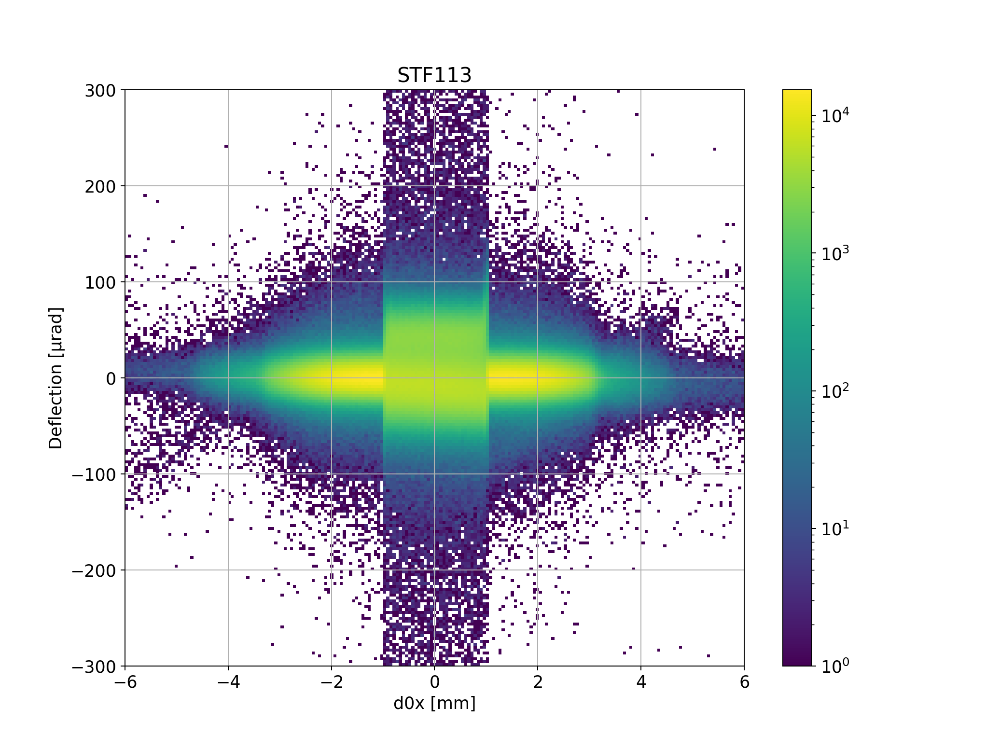

11487452.0


<IPython.core.display.Javascript object>


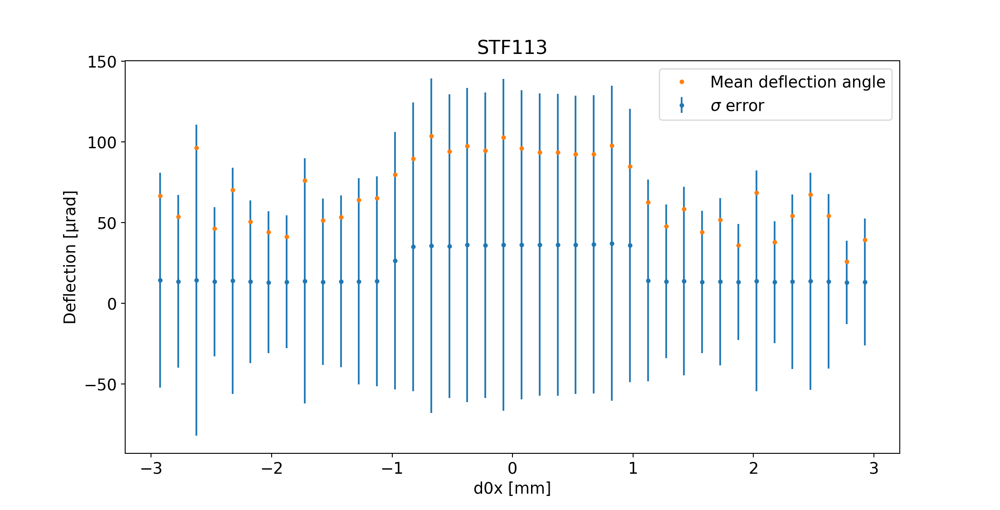

In [35]:
####################### Geometrical Cuts #######################
####################### Visualisation plot
fig, ax = pl.subplots()


xbins = np.linspace(-6, 6.,200)
ybins = np.linspace(-300, 300, 200)


counts, xedges, yedges, _ = pl.hist2d(data_1['d0_x'],data_1['defl_x'], bins=(xbins, ybins), 
                                       norm=mpl.colors.LogNorm(),
                                       cmap=pl.cm.viridis)

print (np.sum(counts))
cbar = pl.colorbar() 
pl.grid()   
pl.show()



####################### analysis by looking at mean impact for each impact x slices bins 40, range -3,3

means_result = scipy.stats.binned_statistic(data_1['d0_x'], [data_1['defl_x'], data_1['defl_x']**2], bins=40, 
                                             range=(-3.,3.), 
                                            statistic='std')

means, means2 = means_result.statistic
standard_deviations = np.sqrt(means2 - means**2)
bin_edges = means_result.bin_edges
bin_centers = (bin_edges[:-1] + bin_edges[1:])/2.

#print (bin_centers,means)

fig1, ax1 = pl.subplots()
ax.set_title('STF113')
ax.set_xlabel('d0x [mm]')
ax.set_ylabel('Deflection [µrad]')

ax1.set_title('STF113')
ax1.set_xlabel('d0x [mm]')
ax1.set_ylabel('Deflection [µrad]')


pl.errorbar(x=bin_centers, y=means, yerr=standard_deviations, linestyle='none', marker='.',label=r'$\sigma$ error')
pl.plot(bin_centers, standard_deviations, linestyle='none', marker='.',label='Mean deflection angle')


cut = bin_centers[means>10]
ax1.legend()
#print(r'Geometrical horizontal cut at {:2.2f} mm and {:2.2f} mm'.format(cut.min(),cut.max()))



<IPython.core.display.Javascript object>


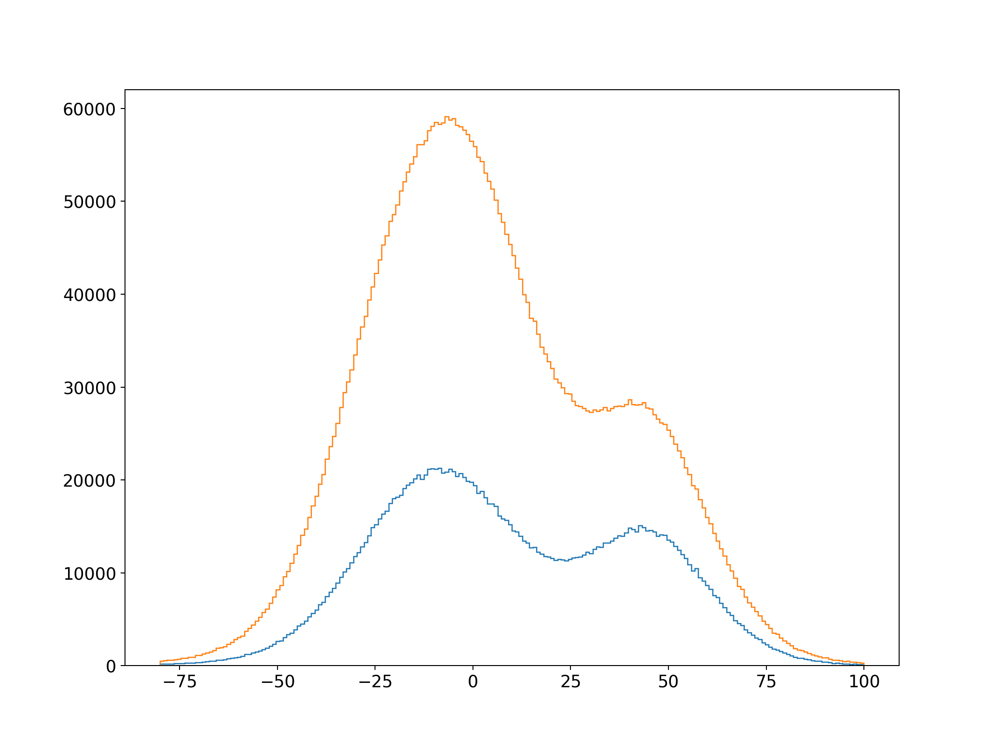

In [6]:
fig1, ax1 = pl.subplots()

nbins= np.linspace(-80,100,201)
ax1.hist(data_1.loc[(data_1['d0_x']<1) & (data_1['d0_x']>-1) & (data_1['thetaIn_x']<crit_angle) & (data_1['thetaIn_x']>-crit_angle),'defl_x'],bins=nbins,histtype='step')
ax1.hist(data_1.loc[(data_1['d0_x']<1) & (data_1['d0_x']>-1),'defl_x'],bins=nbins,histtype='step')

pl.show()
#ax.set_xlim()

# Torsion analysis

##### crystals might be twisted along their vertical dimension, to avoid loosing statistic we correct this effect modifying the impact distribution as
##### thetaX_In_corrected = thetaX_In * Torsion + Offest 

<IPython.core.display.Javascript object>


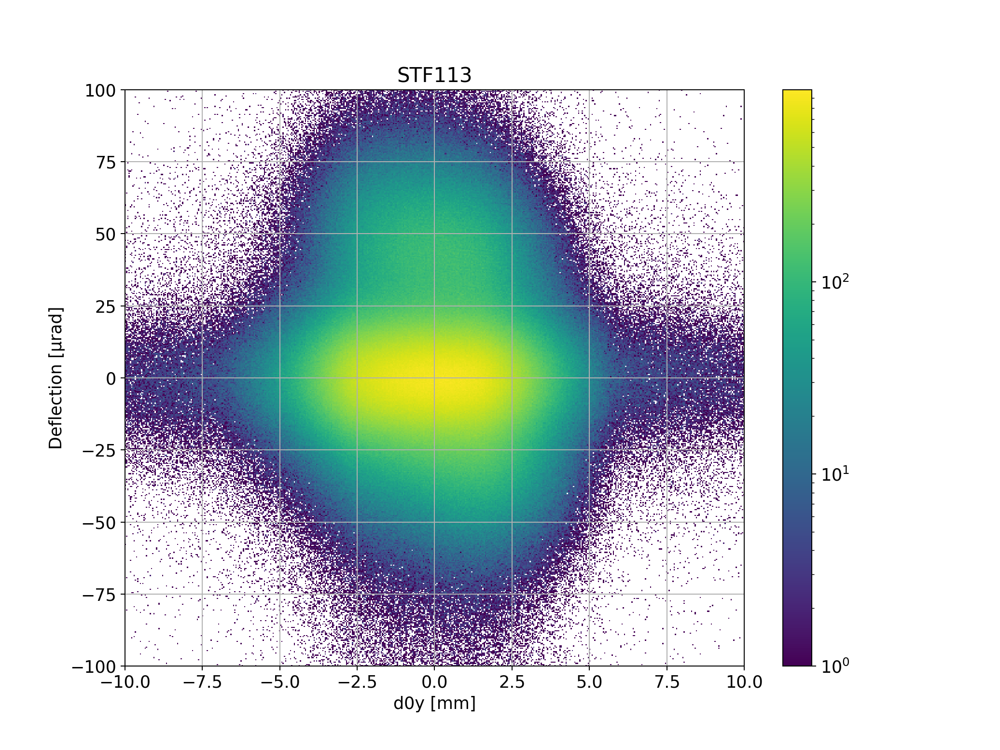

11453639.0


<IPython.core.display.Javascript object>


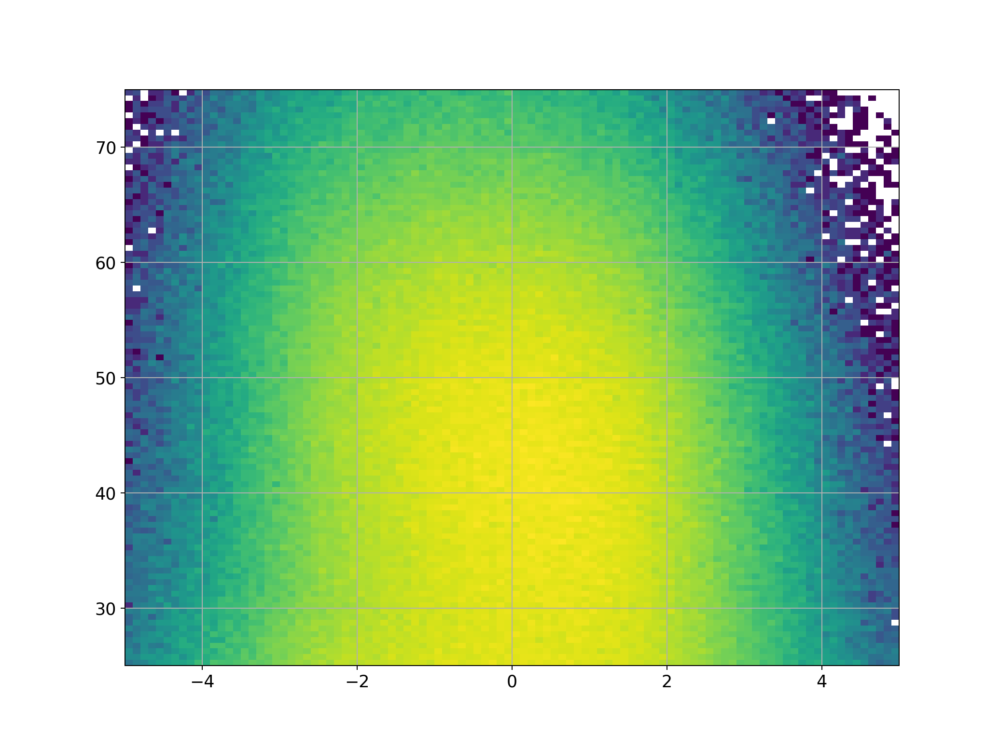

In [7]:
####################### Visualisation plots
fig1, ax1 = pl.subplots()
ax1.set_title('STF113')
ax1.set_xlabel('d0y [mm]')
ax1.set_ylabel('Deflection [µrad]')

xbins1 = np.linspace(-10, 10, 500)
ybins1 = np.linspace(-100, 100,500)


counts1, xedges1, yedges1, _ = pl.hist2d(data_1['d0_y'],data_1['defl_x'], bins=(xbins1, ybins1), 
                                       norm=mpl.colors.LogNorm(),
                                       cmap=pl.cm.viridis
                                     )

print (np.sum(counts1))
cbar = pl.colorbar() 
pl.grid()   
pl.show()


torsion = data_1.loc[(data_1['defl_x']>25.) & (data_1['defl_x']<75.) &  (data_1['d0_y']<5) & (data_1['d0_y']>-5) & (data_1['d0_x']<1) & (data_1['d0_x']>-1)]



fig2, ax2 = pl.subplots()
#pl.ylim(100,250)
#pl.xlim(-2.5,3.5)
pl.hist2d(torsion['d0_y'],torsion['defl_x'],bins=(100,100), 
                                       norm=mpl.colors.LogNorm(),
                                       cmap=pl.cm.viridis 
          )



par, cov = curve_fit(linear,torsion['d0_y'],torsion['defl_x'])
pl.plot(torsion['d0_y'], linear(par[0], par[1],torsion['d0_y']))
#print (np.sum(counts1))
#cbar = pl.colorbar() 
pl.grid()   
pl.show()

<IPython.core.display.Javascript object>


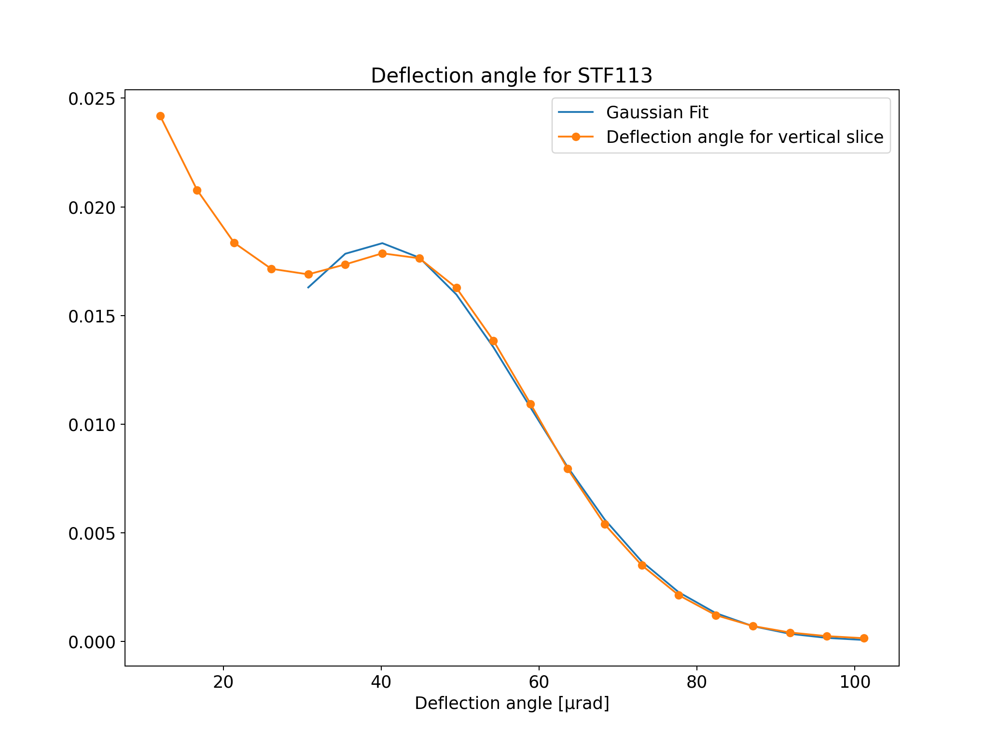

[3.30978364e+01 2.34703778e+01 2.36061745e-02]
[3.97657657e+01 1.85618444e+01 1.83324205e-02]


(array([11.97449638]), 39.76576571811522, 0.07894797200386133)

In [8]:
#######OWN FUNCTION FOR MODE
mode_bins = 21

def func(ylim1,ylim2,rang1,rang2,bins,mu,A):
    selection = data_1.loc[(data_1['d0_y']<rang2) & (data_1['d0_y']>rang1) & (data_1['d0_x']<1) & (data_1['d0_x']>-1)]# & (data_1['thetaIn_x']<crit_angle) & (data_1['thetaIn_x']>-crit_angle)]

    fig, ax = pl.subplots()
    xmin, xmax = 18,85
    lnspc = np.linspace(xmin, xmax, bins)

    d_f, v_f  = np.histogram(selection['defl_x'],bins=lnspc,density=True)#,range=(rang1,rang2))
    
    func.c_f = (v_f[:-1] + v_f[1:]) / 2

    func.x_max = func.c_f[d_f==max(d_f)]
    
    param_o = (mu,10,A)
    
    func.par_o, cov_o = curve_fit(gaussian,func.c_f,d_f,param_o)

    
    
    xmin, xmax = func.par_o[0]-np.abs(func.par_o[1]), func.par_o[0]+3*np.abs(func.par_o[1])
    print(func.par_o)
    lnspc = np.linspace(xmin, xmax, bins)

    d_f, v_f  = np.histogram(selection['defl_x'],bins=lnspc,density=True)#,range=(rang1,rang2))
    
    func.c_f = (v_f[:-1] + v_f[1:]) / 2

    func.x_max = func.c_f[d_f==max(d_f)]
    
    param_o = func.par_o
    
    func.par_o, cov_o = curve_fit(gaussian,func.c_f[4:],d_f[4:],param_o)
    
    
    pl.plot(func.c_f[4:], gaussian(func.c_f[4:],func.par_o[0],func.par_o[1],func.par_o[2]),label='Gaussian Fit')
    
    print(func.par_o)
    
    func.chi2 = sum((d_f-gaussian(func.c_f,func.par_o[0],func.par_o[1],func.par_o[2]))**2/gaussian(func.c_f,func.par_o[0],func.par_o[1],func.par_o[2]))
    
    #print(func.x_max)
    pl.plot(func.c_f,d_f,'-o',label='Deflection angle for vertical slice')#label=f'{ylim1}-{ylim2} mm')
    #pl.hlines(max(d_f),func.x_max-10,func.x_max+10,'r')
    pl.legend(loc='best')
    pl.xlabel('Deflection angle [µrad]')
    pl.title('Deflection angle for STF113')
    
    
    #textstr = '\n'.join((
    #r'Chi2 = %.6f' % (func.chi2),))
    #props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    #ax.text(0.75, 0.95, textstr, transform=ax.transAxes, fontsize=10,
     #   verticalalignment='top', bbox=props)
    
    
    return func.x_max, func.par_o[0], func.chi2
   
    



    
#Changing selection naturally raises channeling peak and lowers amorphous peak.
#func(-4,4,-1,1,51)
#func(-3,3,-1,1,51)
func(-2,2,-3,3,mode_bins,46,0.003)
#func(-2,2,-1,1,51,42,0.003)
#func(-2,2,-0.5,0.5,51,42,0.003)

<IPython.core.display.Javascript object>


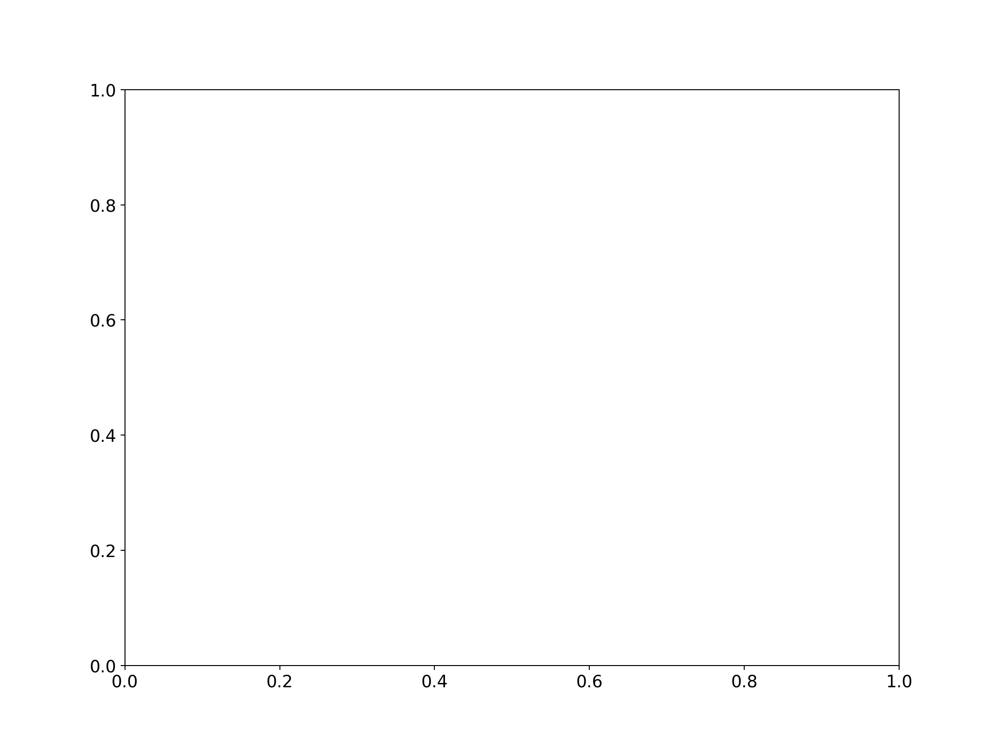

<IPython.core.display.Javascript object>


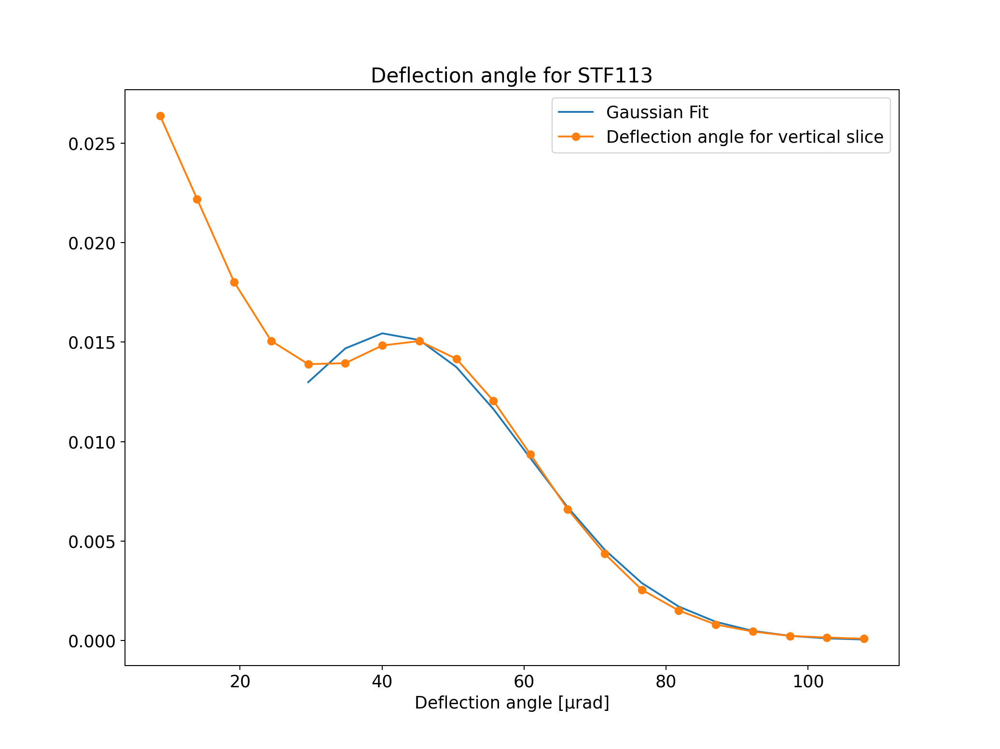

[3.22074850e+01 2.60878504e+01 2.25167433e-02]
[4.10538499e+01 1.93809705e+01 1.54658224e-02]


<IPython.core.display.Javascript object>


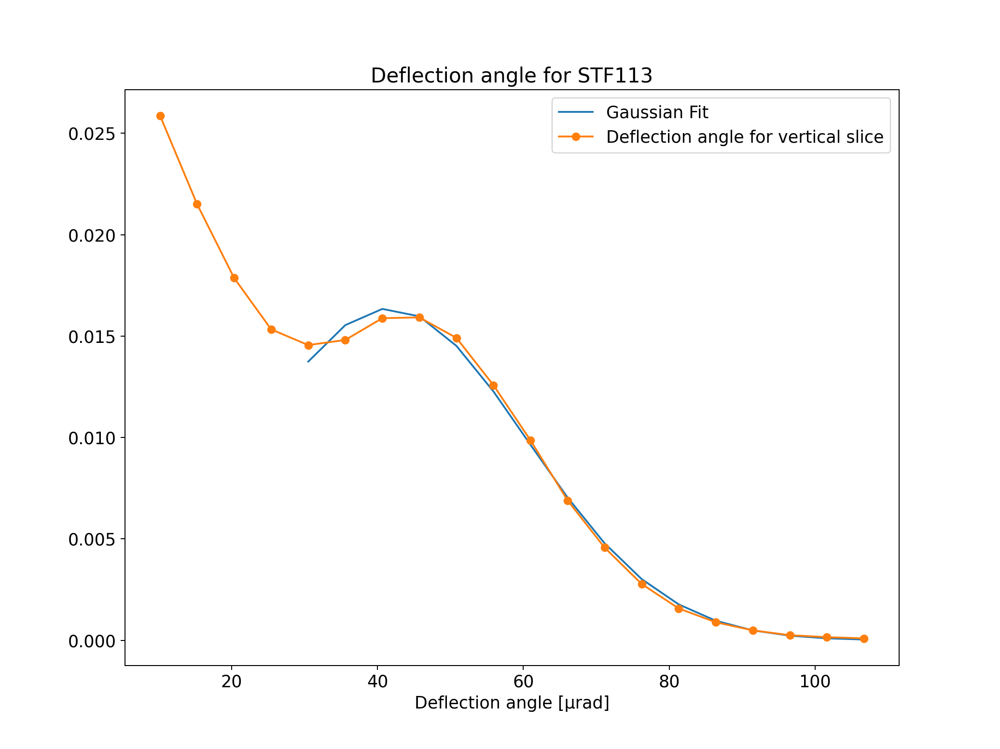

[3.30462529e+01 2.54015647e+01 2.25571618e-02]
[4.16233826e+01 1.88262461e+01 1.63636599e-02]


<IPython.core.display.Javascript object>


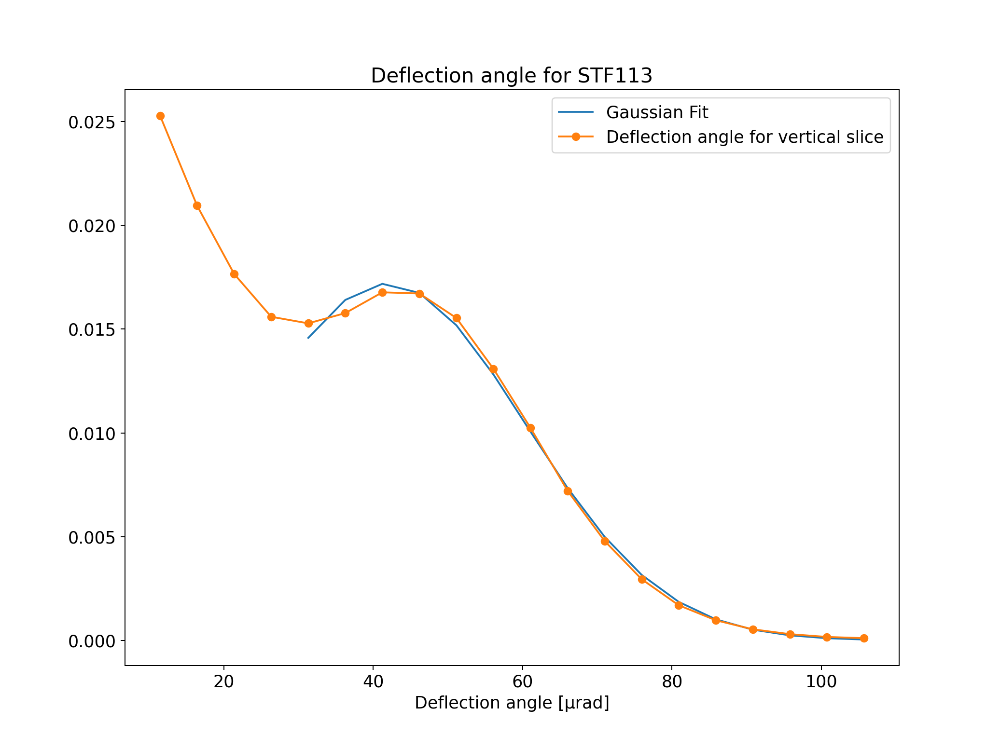

[3.37719528e+01 2.48004755e+01 2.26081645e-02]
[4.19124848e+01 1.84803521e+01 1.71935693e-02]


<IPython.core.display.Javascript object>


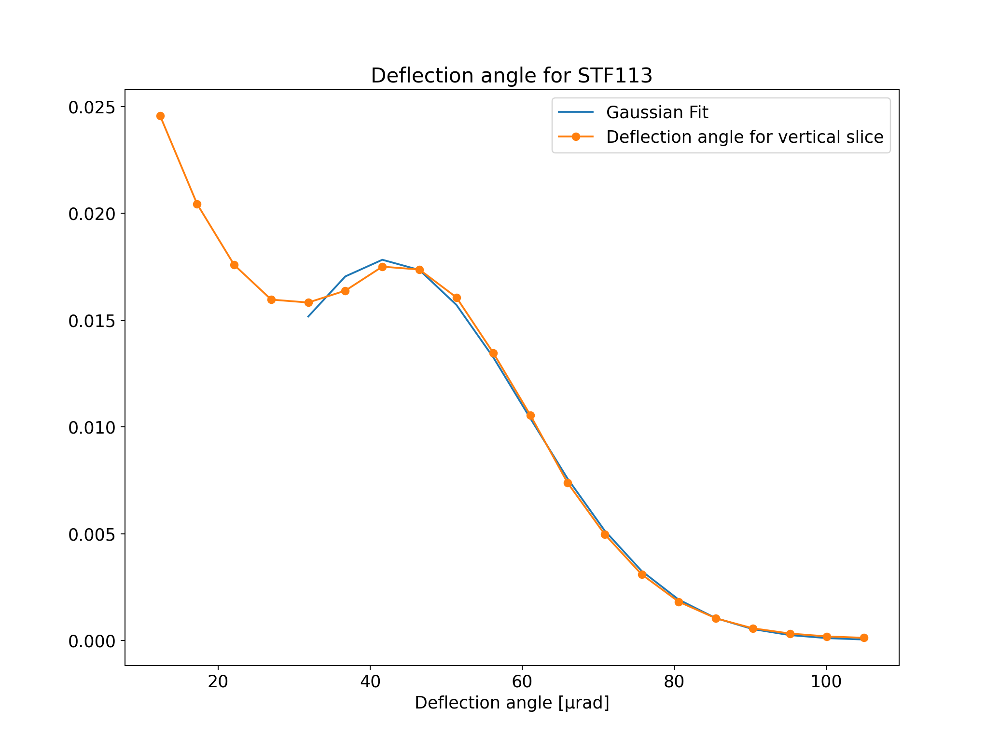

[3.42845774e+01 2.43725171e+01 2.26524241e-02]
[4.21931967e+01 1.81746939e+01 1.78303280e-02]


<IPython.core.display.Javascript object>


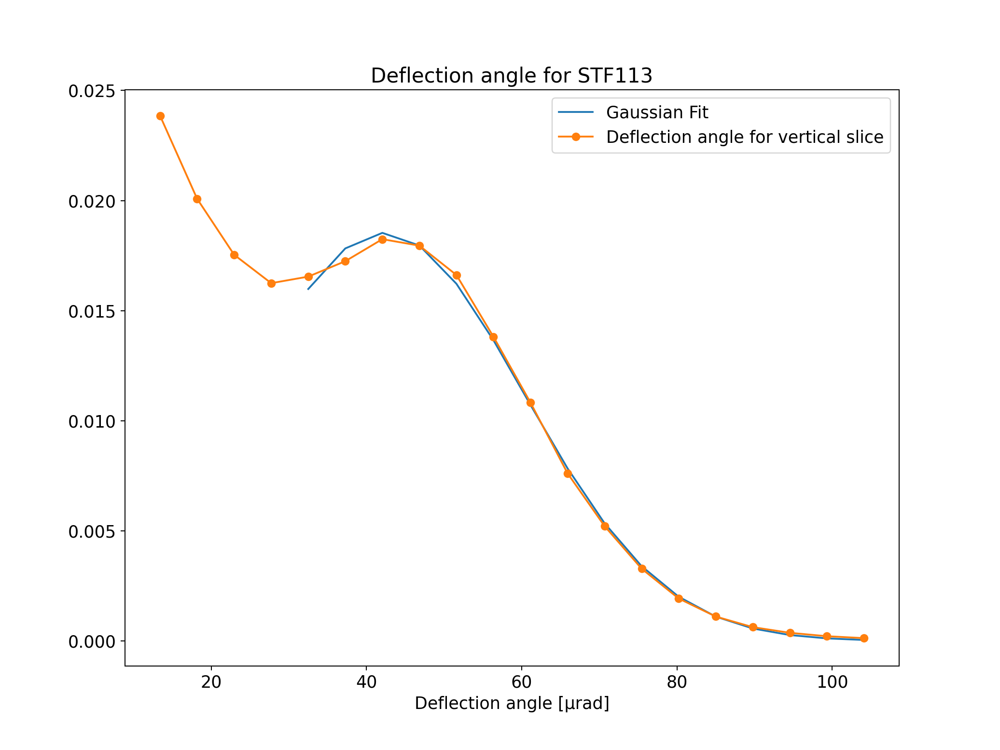

[3.48839707e+01 2.38641444e+01 2.27157650e-02]
[4.22935075e+01 1.80022389e+01 1.85368403e-02]


<IPython.core.display.Javascript object>


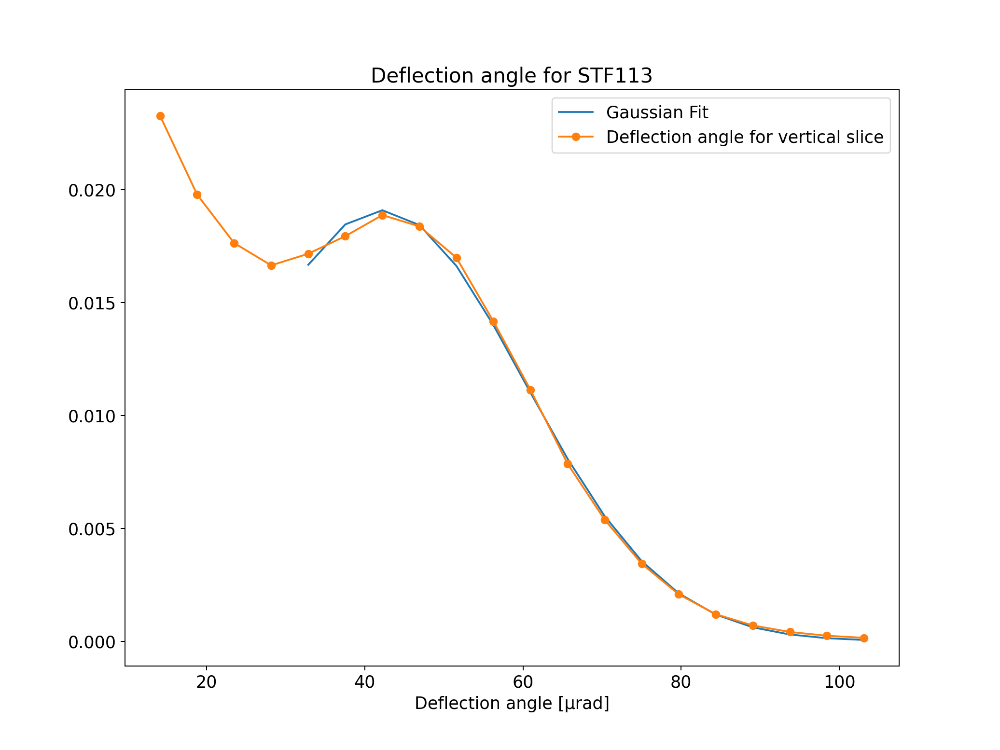

[3.52007735e+01 2.34167329e+01 2.28543109e-02]
[4.21739590e+01 1.79005460e+01 1.90971914e-02]


<IPython.core.display.Javascript object>


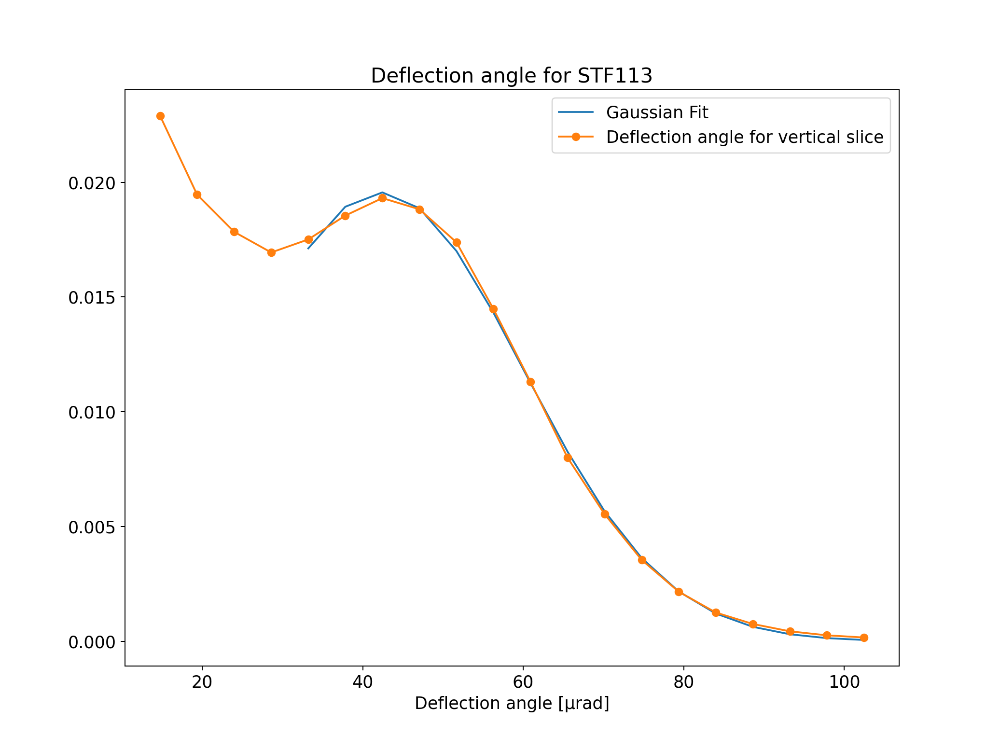

[3.55208912e+01 2.30795906e+01 2.29386054e-02]
[4.23329769e+01 1.76648308e+01 1.95605535e-02]


<IPython.core.display.Javascript object>


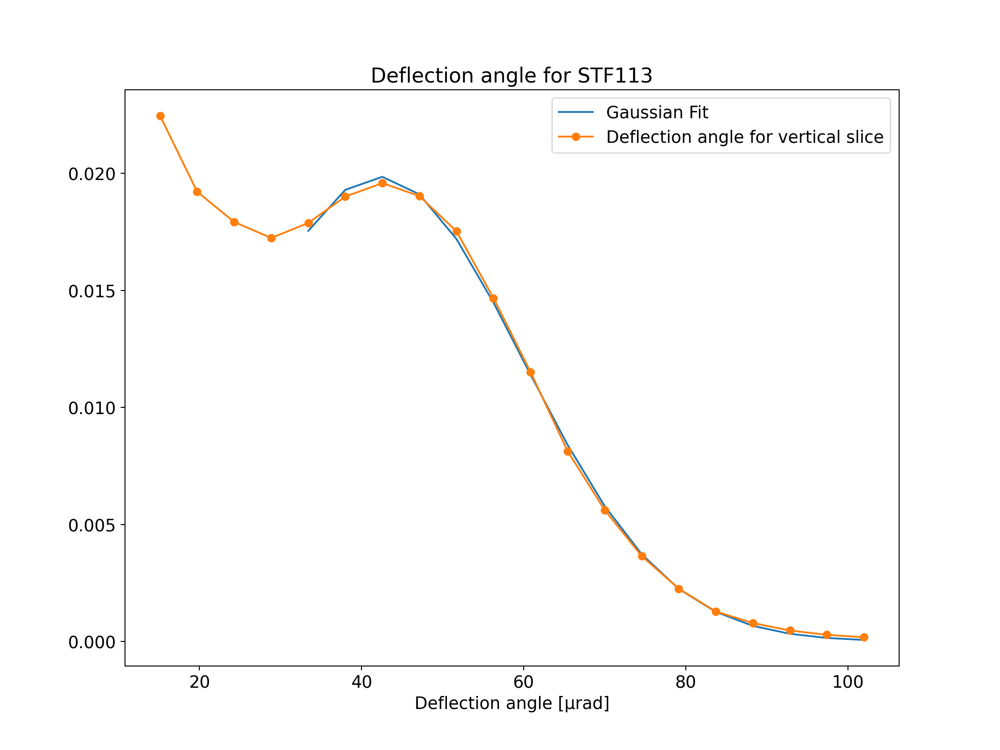

[3.56994662e+01 2.28519646e+01 2.30070787e-02]
[4.22138375e+01 1.76820007e+01 1.98627587e-02]


<IPython.core.display.Javascript object>


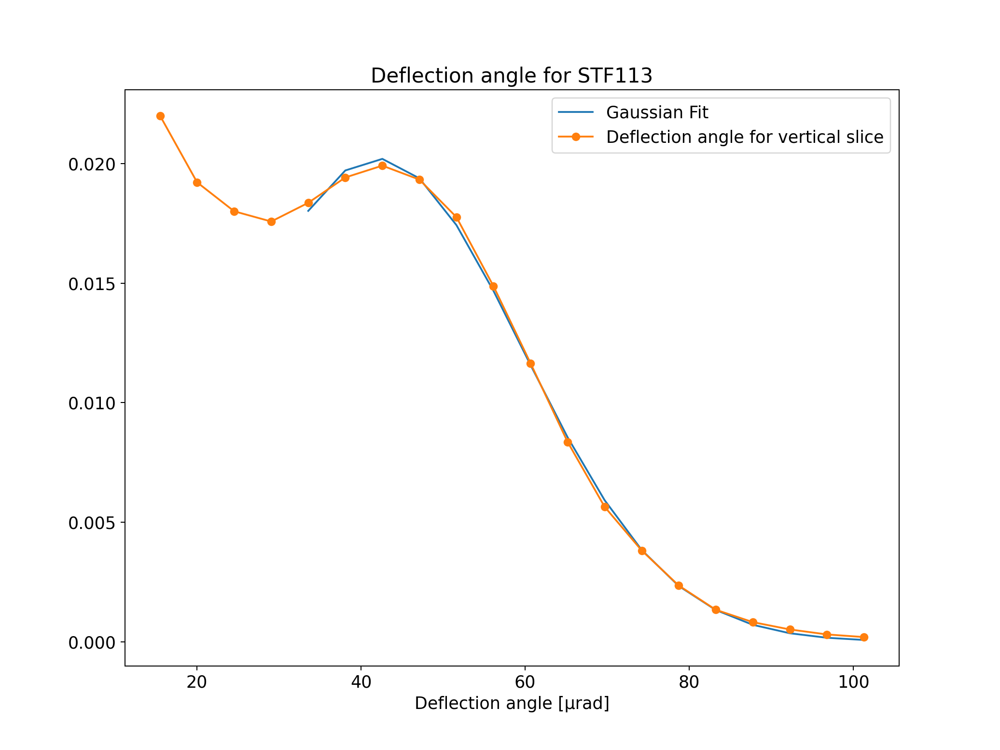

[3.58258577e+01 2.25738620e+01 2.31286496e-02]
[4.20183655e+01 1.76564033e+01 2.02133135e-02]


<IPython.core.display.Javascript object>


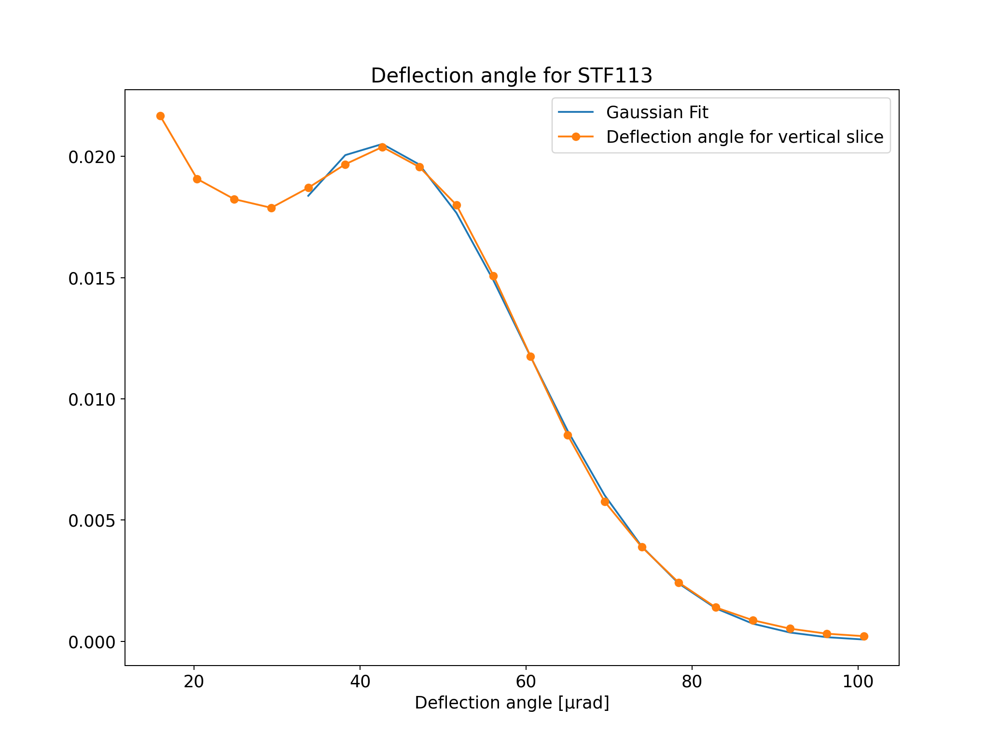

[3.59902867e+01 2.23203466e+01 2.32239524e-02]
[4.20114787e+01 1.75393901e+01 2.05310553e-02]


<IPython.core.display.Javascript object>


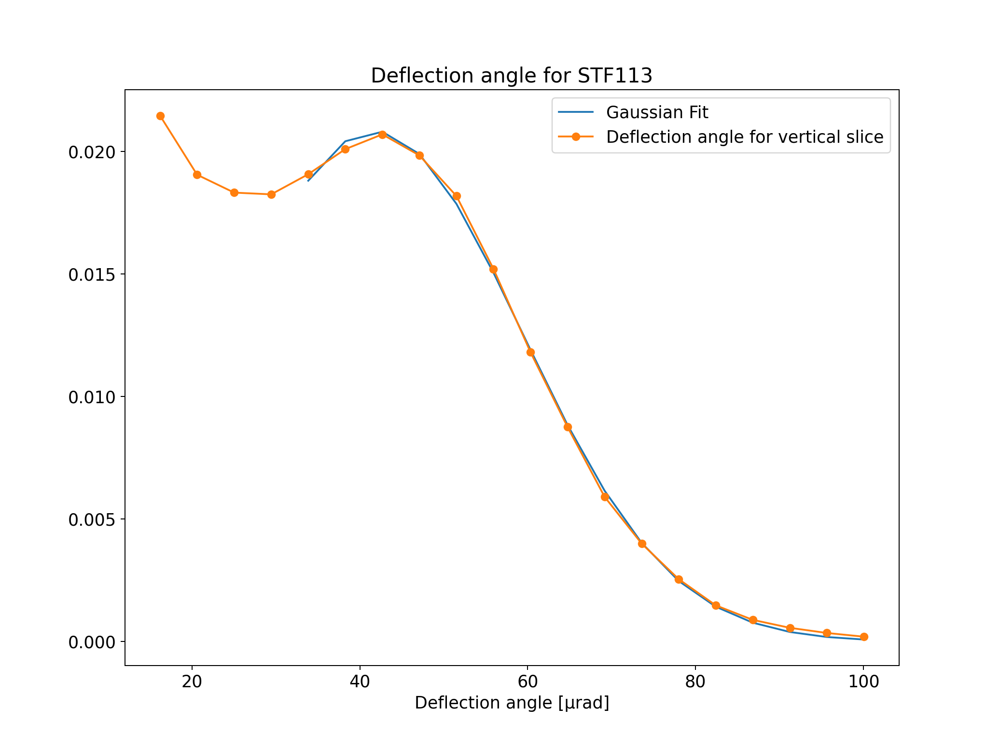

[3.60582532e+01 2.20679010e+01 2.33530070e-02]
[4.17819767e+01 1.75340482e+01 2.08240923e-02]


<IPython.core.display.Javascript object>

[3.61688081e+01 2.17830228e+01 2.34986738e-02]
[4.16248239e+01 1.74455679e+01 2.12008502e-02]


<IPython.core.display.Javascript object>


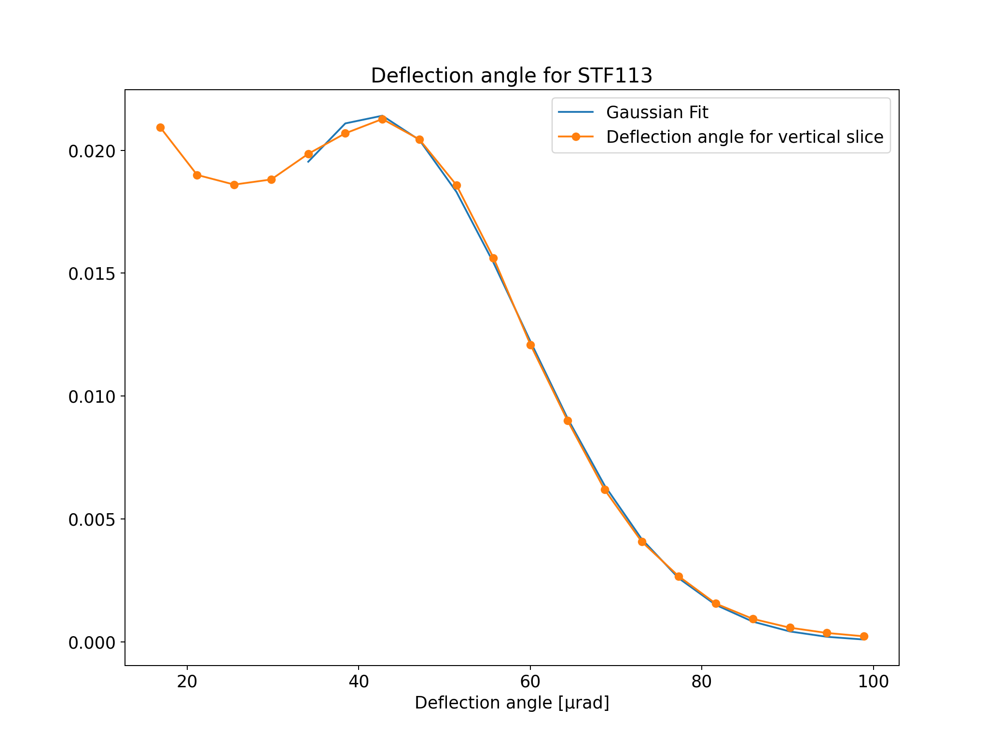

[3.62694872e+01 2.15960464e+01 2.35890095e-02]
[4.16173709e+01 1.73465235e+01 2.14561371e-02]


/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78547/3480671395.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = pl.subplots()


<IPython.core.display.Javascript object>


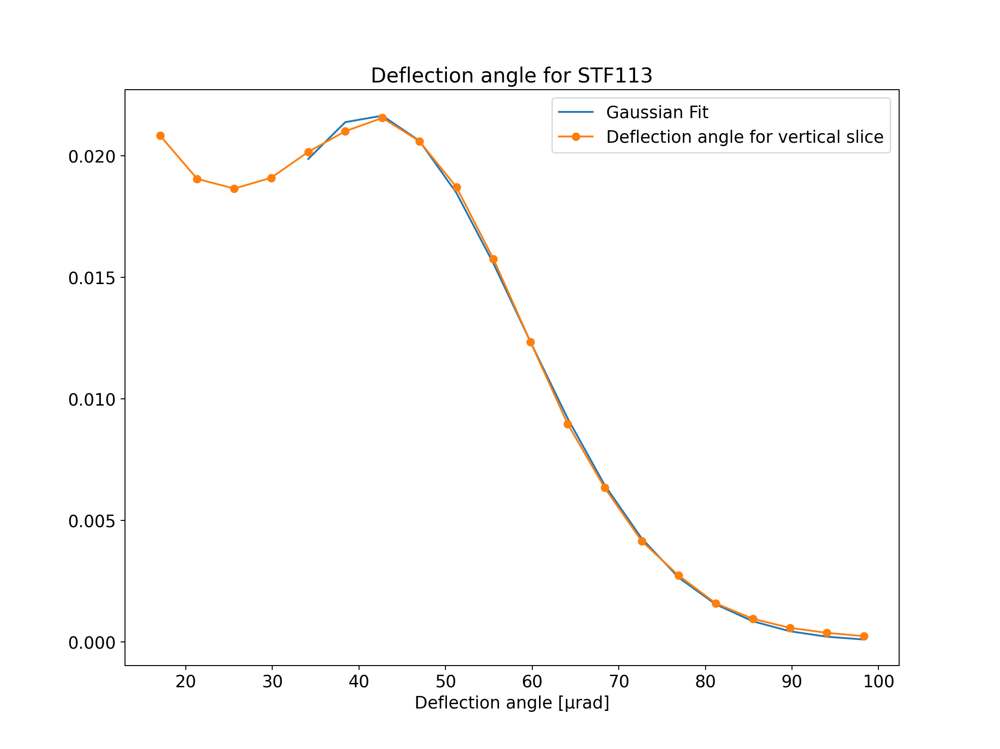

[3.62819325e+01 2.13873576e+01 2.37234560e-02]
[4.14207758e+01 1.72988742e+01 2.17173754e-02]


<IPython.core.display.Javascript object>


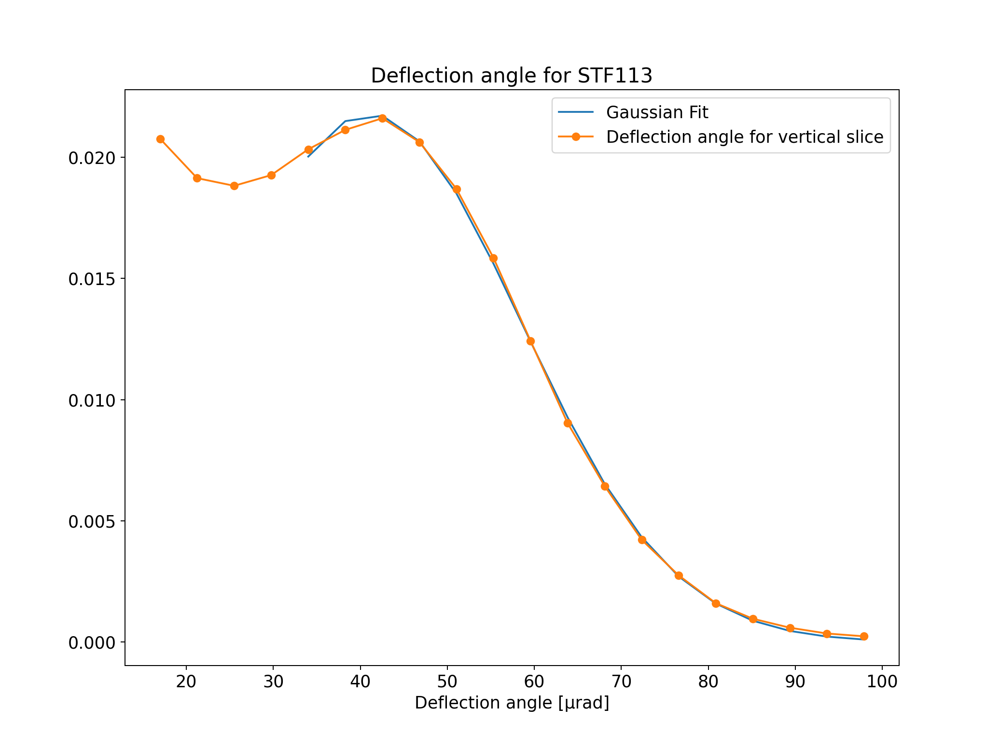

[3.61389999e+01 2.12958382e+01 2.38351403e-02]
[4.11287705e+01 1.73640416e+01 2.17790340e-02]


<IPython.core.display.Javascript object>


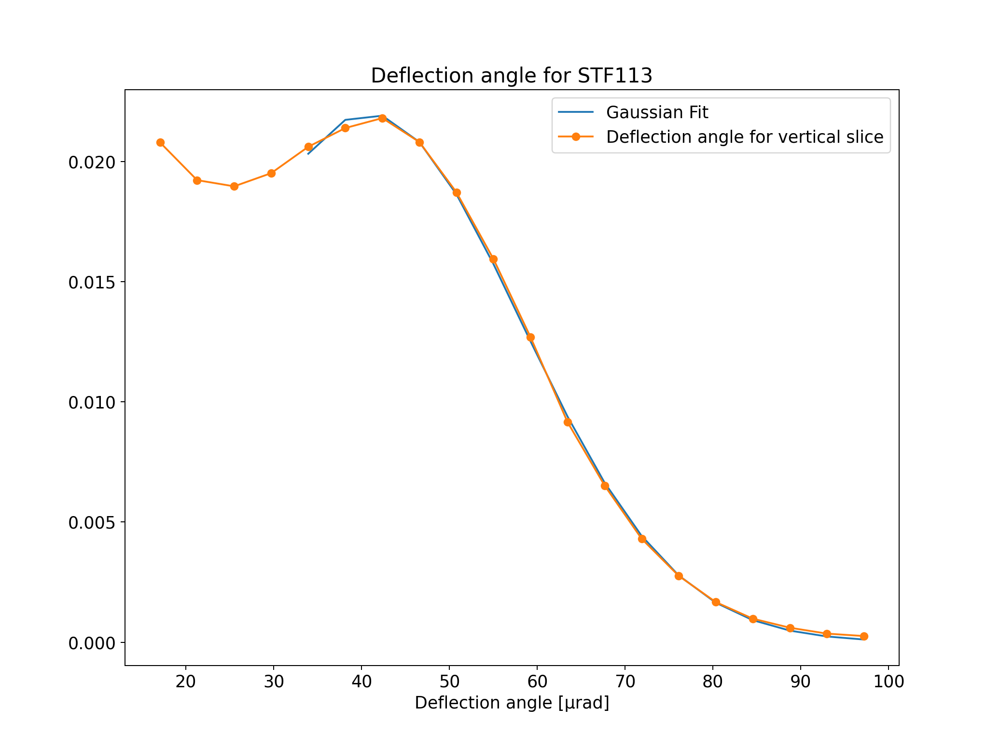

[3.60388913e+01 2.10836188e+01 2.40189181e-02]
[4.08210830e+01 1.73397366e+01 2.19988986e-02]


<IPython.core.display.Javascript object>


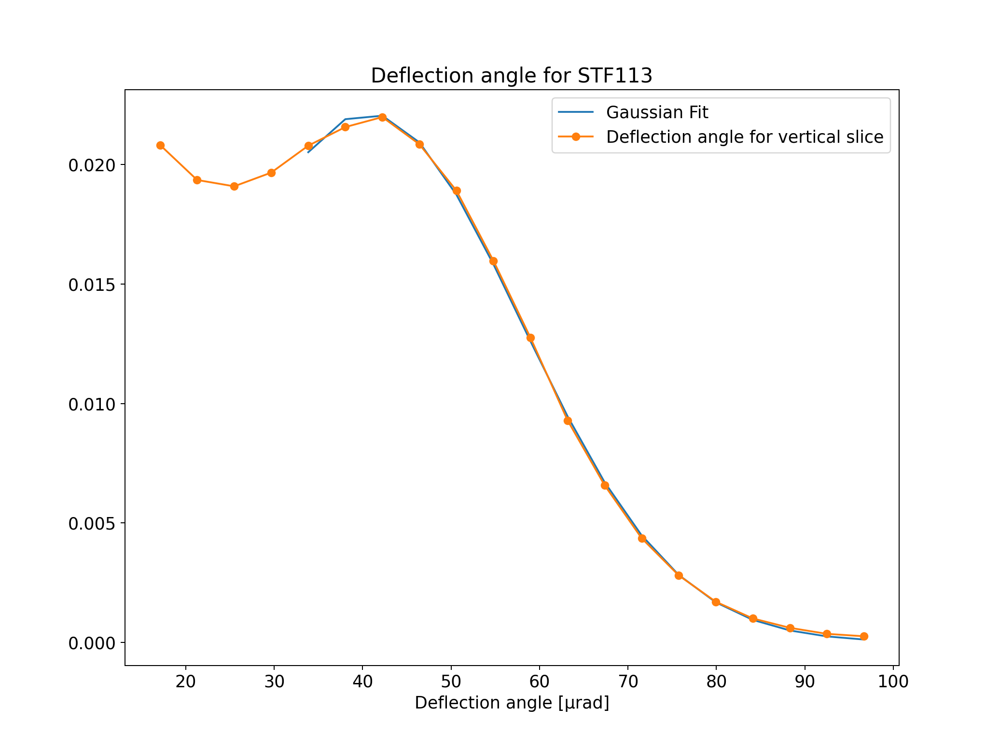

[3.59388779e+01 2.09459270e+01 2.41531875e-02]
[4.06023651e+01 1.73045846e+01 2.21445885e-02]


<IPython.core.display.Javascript object>

[3.56883938e+01 2.08979563e+01 2.42828360e-02]
[4.03730445e+01 1.72686890e+01 2.21417333e-02]


<IPython.core.display.Javascript object>

[3.53767736e+01 2.09000856e+01 2.43958720e-02]
[4.00148116e+01 1.73402809e+01 2.20624699e-02]


<IPython.core.display.Javascript object>

[3.50427752e+01 2.09184869e+01 2.45144239e-02]
[3.96876529e+01 1.73778491e+01 2.19643865e-02]


<IPython.core.display.Javascript object>

[3.46548143e+01 2.09123690e+01 2.46767624e-02]
[3.92618140e+01 1.74408724e+01 2.18744565e-02]


<IPython.core.display.Javascript object>


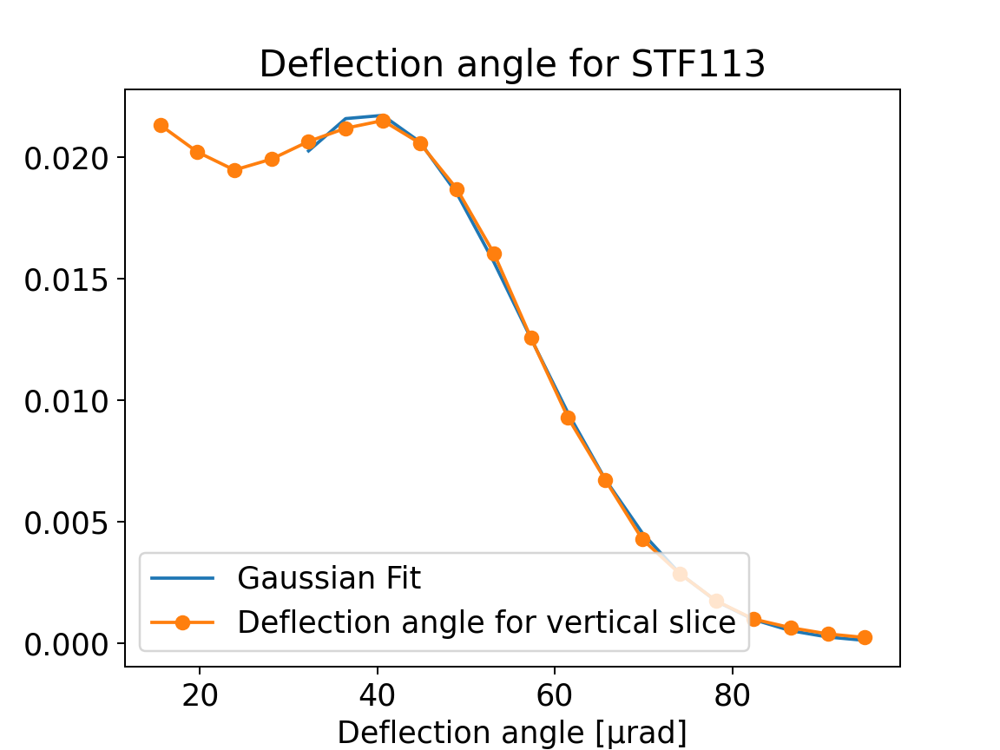

[3.43365606e+01 2.08931144e+01 2.48238790e-02]
[3.89610274e+01 1.74435168e+01 2.18107892e-02]


<IPython.core.display.Javascript object>


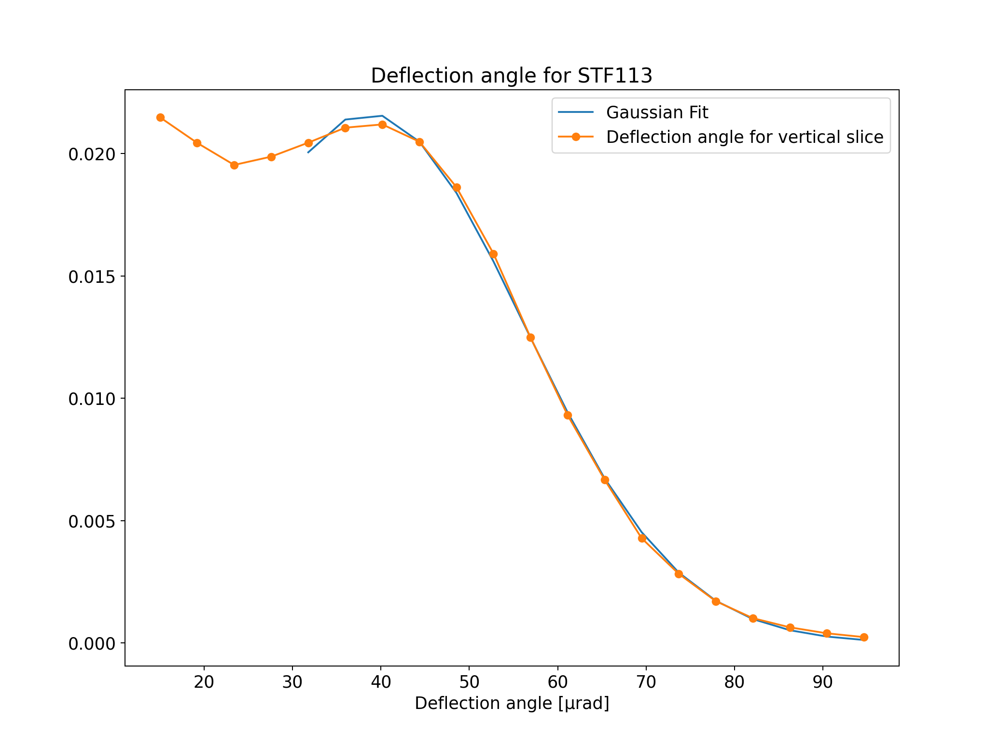

[3.38894221e+01 2.09452747e+01 2.49803221e-02]
[3.86010901e+01 1.74725722e+01 2.16376783e-02]


<IPython.core.display.Javascript object>


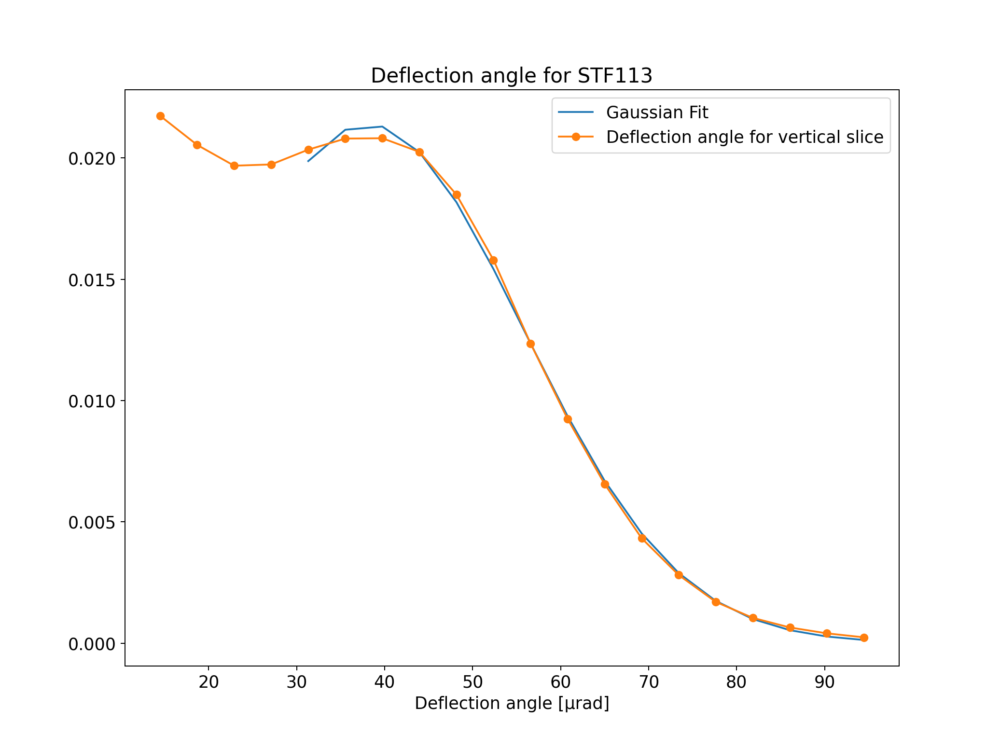

[3.34235386e+01 2.10508484e+01 2.51032120e-02]
[3.80895008e+01 1.76547110e+01 2.13892591e-02]


<IPython.core.display.Javascript object>


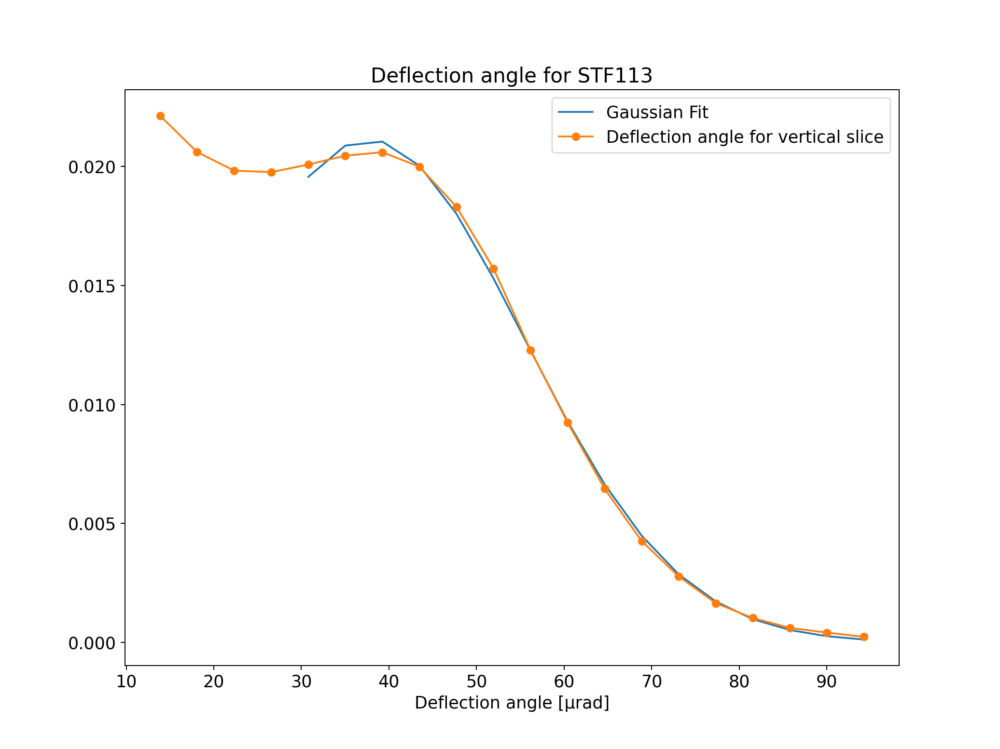

[3.29032493e+01 2.11522220e+01 2.52706425e-02]
[3.77242590e+01 1.76947678e+01 2.11157447e-02]


<IPython.core.display.Javascript object>


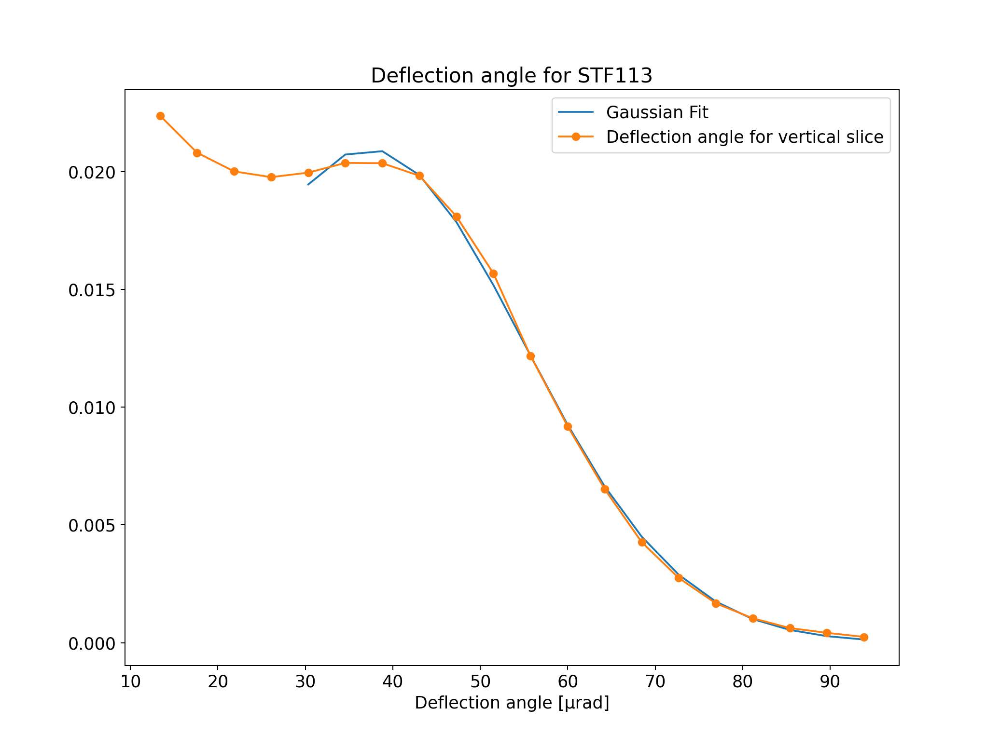

[3.24560253e+01 2.11703066e+01 2.54650229e-02]
[3.71997695e+01 1.78184711e+01 2.09560092e-02]


<IPython.core.display.Javascript object>

[3.19017621e+01 2.13150991e+01 2.56286820e-02]
[3.65630842e+01 1.80551123e+01 2.06625626e-02]


<IPython.core.display.Javascript object>

[3.12714414e+01 2.14669105e+01 2.58279213e-02]
[3.58633373e+01 1.83434081e+01 2.02880182e-02]


<IPython.core.display.Javascript object>

[3.05020483e+01 2.16646587e+01 2.60760897e-02]
[3.49589685e+01 1.87136490e+01 1.98392182e-02]


<IPython.core.display.Javascript object>


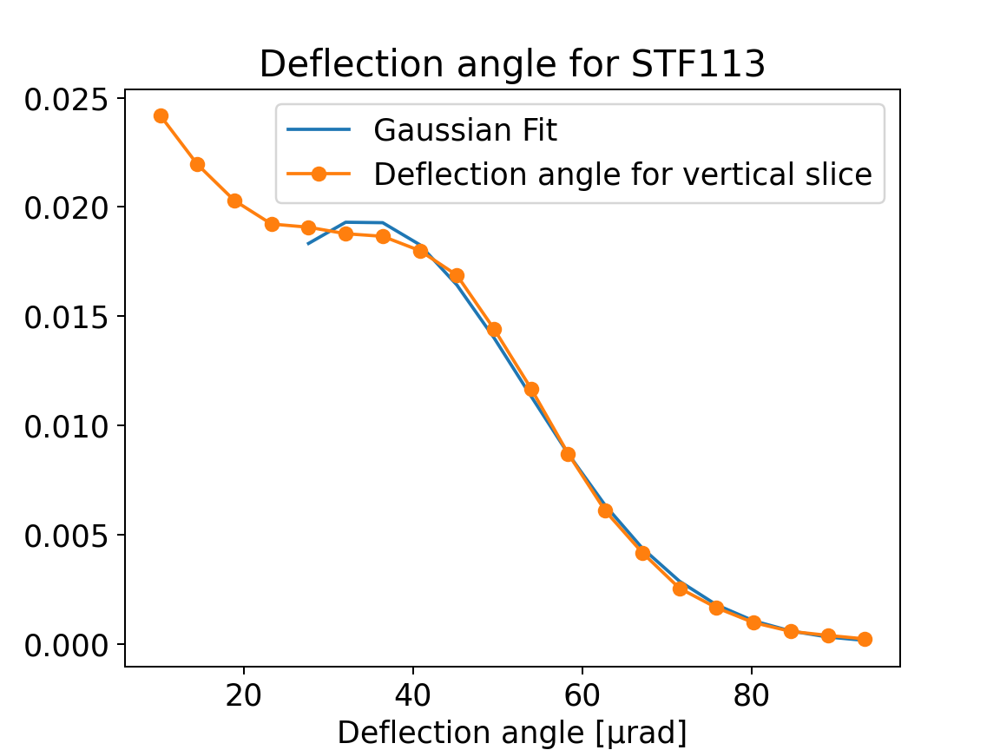

[2.98448156e+01 2.18859827e+01 2.62546245e-02]
[3.41341493e+01 1.90749901e+01 1.94150426e-02]


[41.05384988441906,
 41.623382558968274,
 41.91248480337677,
 42.193196651670384,
 42.29350749302234,
 42.173958988959335,
 42.332976912965975,
 42.2138375008718,
 42.018365481169916,
 42.01147865741253,
 41.781976707953284,
 41.62482390001646,
 41.617370936880114,
 41.420775763366166,
 41.12877053442483,
 40.821083003521984,
 40.60236511758716,
 40.373044526754846,
 40.01481161978526,
 39.68765289676855,
 39.26181398116375,
 38.96102739021124,
 38.601090148272284,
 38.089500839776626,
 37.72425895961048,
 37.199769541149486,
 36.563084151514396,
 35.863337257415,
 34.95896851728514,
 34.134149317460256]

In [9]:
#21/20
fig, ax = pl.subplots()
n_plots = 30

maxes = []
centers_y = []
yrange = np.linspace(-2,2,n_plots+1)

for i,j in zip(yrange, range(n_plots)):
    centers = (yrange[j]+yrange[j+1])/2
    centers_y.append(centers)
    
    func(-2,2,i,i+1,mode_bins,func.par_o[0],func.par_o[2])
    maxes.append(func.par_o[0])
    
maxes
#centers_y

<IPython.core.display.Javascript object>


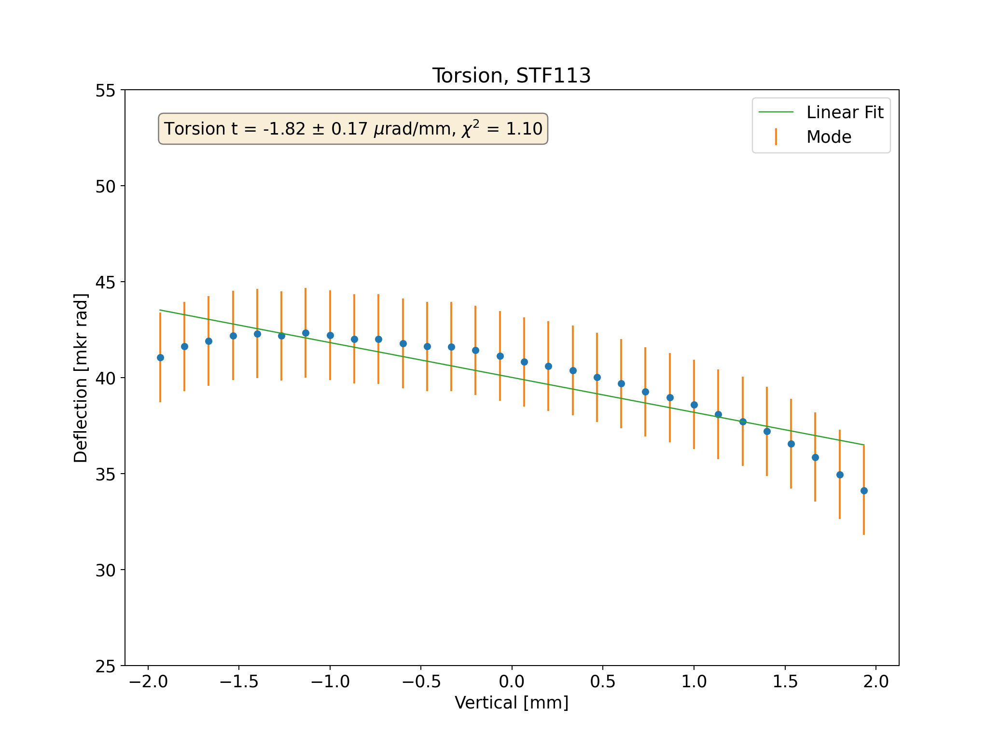

[-1.81580111 40.00855713]
[[ 2.76351057e-02 -2.41903272e-10]
 [-2.41903272e-10  3.68058621e-02]]
chi2 =  1.1041758729474442


Text(0.05, 0.95, 'Torsion t = -1.82 $\\pm$ 0.17 $\\mu$rad/mm, $\\chi^2$ = 1.10')

In [10]:
fig, ax = pl.subplots()
ax.plot(centers_y,maxes,'o',markersize=5)
ax.set_xlabel('Vertical [mm]')
ax.set_ylabel('Deflection [mkr rad]')

error_bin = (centers_y[1]-centers_y[0])/2
error_bin = np.sqrt(np.var(maxes))

pl.errorbar(x=centers_y, y=maxes, yerr=error_bin, linestyle='none',label='Mode')
param = (-0.1,42)
par, cov = curve_fit(linear,centers_y,maxes,p0=param)
print(par)
print(cov)
pl.title('Torsion, STF113')
pl.plot(centers_y, linear(np.asarray(centers_y),par[0], par[1]), label = 'Linear Fit',linewidth=1)
pl.ylim(25,55)

pl.legend()
chi2 = sum((maxes-linear(np.asarray(centers_y),par[0], par[1]))**2)/(len(maxes)-2)

print('chi2 = ', chi2)#/len(d_f)


t_err = np.sqrt(np.diag(cov))[0]
t = par[0]

textstr = '\n'.join((
    r'Torsion t = %.2f $\pm$ %.2f $\mu$rad/mm, $\chi^2$ = %.2f' % (t, t_err,chi2),))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)


In [11]:
####################### Torsion #########################

#means_result = scipy.stats.binned_statistic(torsion['d0_y'], [torsion['defl_x'], torsion['defl_x']**2], bins=61, 
 #                                            range=(-4.,4.), 
  #                                          statistic='mean')

#means, means2 = means_result.statistic
#standard_deviations = np.sqrt(means2 - means**2)/np.sqrt(means.shape[0])
#bin_edges = means_result.bin_edges
#bin_centers = (bin_edges[:-1] + bin_edges[1:])/2.

#print (bin_centers,means)

#fig, ax = pl.subplots()
#pl.xlabel(r'Vertical Impact Position [mm]')
#pl.ylabel(r'Horizontal Deflection [$\mu$rad]')
#pl.ylim(38,49)

#pl.errorbar(x=bin_centers, y=means, yerr=standard_deviations, linestyle='none', marker='.', label='CH Mean Value')

#param = (50,-3)
#par, cov = curve_fit(linear,bin_centers,means,param)
#print(par)
#print(cov)
#pl.plot(bin_centers, linear(par[1], par[0],bin_centers), label = 'Linear Fit')
#pl.title('Torsion fit using scipy stats "mean" ')
#pl.legend()



#t_err = np.sqrt(np.diag(cov))[1]
#t = par[1]

#textstr = '\n'.join((
 #   r'Torsion t = %.2f $\pm$ %.2f $\mu$rad/mm' % (t, t_err),))
#props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
#ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,
 #       verticalalignment='top', bbox=props)

#torsion['thetaIn_corr'] = torsion['thetaIn_x'] + (t * torsion['d0_y'])



In [12]:
#torsion = data_1.loc[(data_1['defl_x']>25.) & (data_1['defl_x']<75.) &  (data_1['d0_y']<4) & (data_1['d0_y']>-4) & (data_1['d0_x']<1) & (data_1['d0_x']>-1)]
torsion['thetaIn_corr'] = torsion['thetaIn_x'] + (t * torsion['d0_y'])

/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78547/3927148595.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  torsion['thetaIn_corr'] = torsion['thetaIn_x'] + (t * torsion['d0_y'])


/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78547/997461037.py:8: RuntimeWarning: invalid value encountered in sqrt
  off_st_dev = np.sqrt(off2 - off**2)


<IPython.core.display.Javascript object>


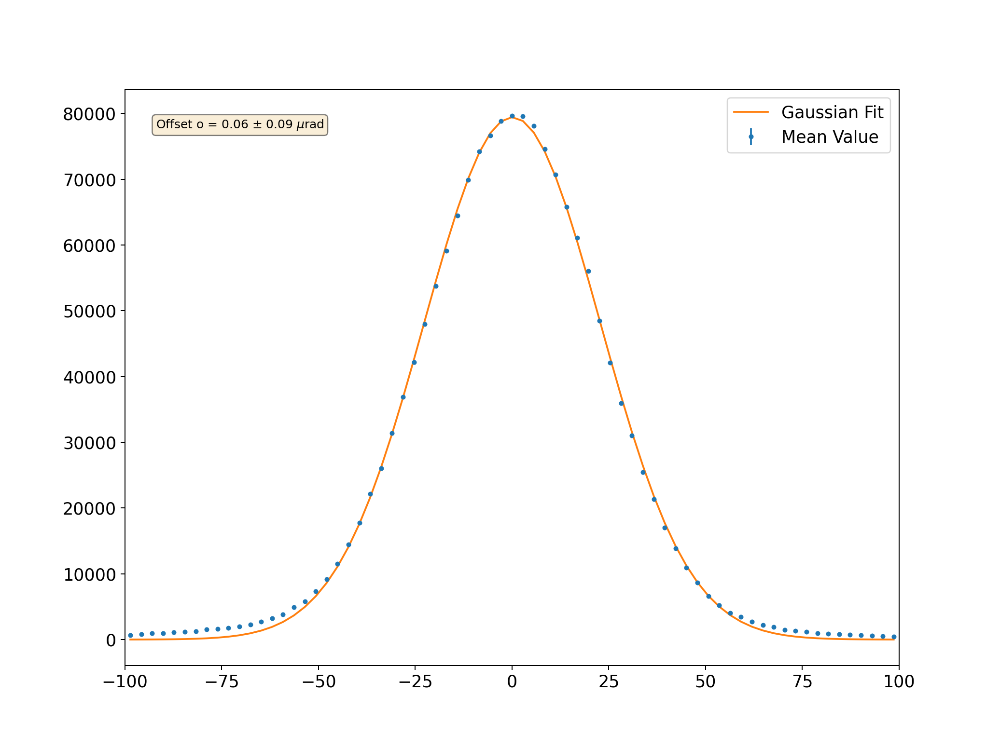

Crystal Torsion t = -1.82 $\pm$ 0.17 $\mu$rad/mm and Offset o = 0.06 $\pm$ 0.09 $\murad$ 


/Users/admin/mambaforge/lib/python3.9/site-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


In [36]:
####################### Offset #######################

off_result = scipy.stats.binned_statistic(torsion['thetaIn_corr'], [torsion['defl_x'], torsion['defl_x']**2], bins=71, 
                                             range=(-100.,100.), 
                                            statistic='count')

off, off2 = off_result.statistic
off_st_dev = np.sqrt(off2 - off**2)
bin_edges_off = off_result.bin_edges
bin_centers_off = (bin_edges_off[:-1] + bin_edges_off[1:])/2.

#print (bin_centers,means)

fig1, ax1 = pl.subplots()


pl.errorbar(x=bin_centers_off, y=off, yerr=off_st_dev, linestyle='none', marker='.', label='Mean Value')
pl.xlim(-100,100)
param_o = (-10,30,1)
par_o, cov_o = curve_fit(gaussian,bin_centers_off,off,param_o)

pl.plot(bin_centers_off, gaussian(bin_centers_off,par_o[0],par_o[1],par_o[2]),label='Gaussian Fit')
pl.legend()


o_err = np.sqrt(np.diag(cov_o))[0]
o = par_o[0]

textstr = '\n'.join((
    r'Offset o = %.2f $\pm$ %.2f $\mu$rad' % (o, o_err),))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax1.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', bbox=props)

print(r'Crystal Torsion t = {:2.2f} $\pm$ {:2.2f} $\mu$rad/mm and Offset o = {:2.2f} $\pm$ {:2.2f} $\murad$ '.format(t,t_err,o,o_err))

In [14]:
####################### Final dataframe for analysis 
####################### with impact angle correction

data =  data_1.loc[(data_1['d0_y']<1) & (data_1['d0_y']>-1) & (data_1['d0_x']<1) & (data_1['d0_x']>-1)]#(data_1['d0_x']<cut.max()) & (data_1['d0_x']>cut.min())]

data['thetaIn_corr'] = data['thetaIn_x'] + (t * data['d0_y'] - o)


/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78547/3718651651.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['thetaIn_corr'] = data['thetaIn_x'] + (t * data['d0_y'] - o)


In [15]:
#off_result = scipy.stats.binned_statistic(data['thetaIn_corr'], [data['defl_x'], data['defl_x']**2], bins=81, 
             #                                range=(-100.,100.), 
              #                              statistic='count')

#off, off2 = off_result.statistic
#off_st_dev = np.sqrt(off2 - off**2)
#bin_edges_off = off_result.bin_edges
#bin_centers_off = (bin_edges_off[:-1] + bin_edges_off[1:])/2.

#print (bin_centers,means)

#fig1, ax1 = pl.subplots()


#pl.errorbar(x=bin_centers_off, y=off, yerr=off_st_dev, linestyle='none', marker='.', label='Mean Value')
#pl.xlim(-100,100)
#param_o = (-10,30,1)
#par_o, cov_o = curve_fit(gaussian,bin_centers_off,off,param_o)

#pl.plot(bin_centers_off, gaussian(bin_centers_off,par_o[0],par_o[1],par_o[2]),label='Gaussian Fit')
#pl.legend()

#o_err = np.sqrt(np.diag(cov_o))[0]
#o = par_o[0]

#textstr = '\n'.join((
 #   r'Offset o = %.2f $\pm$ %.2f $\mu$rad' % (o, o_err),))
#props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
#ax1.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,
 #       verticalalignment='top', bbox=props)

In [16]:
np.mean(data['thetaIn_corr'])

0.1440325477862508

# Analysis

##### Main visualisation plot:
##### deflection vs impact angle

<IPython.core.display.Javascript object>


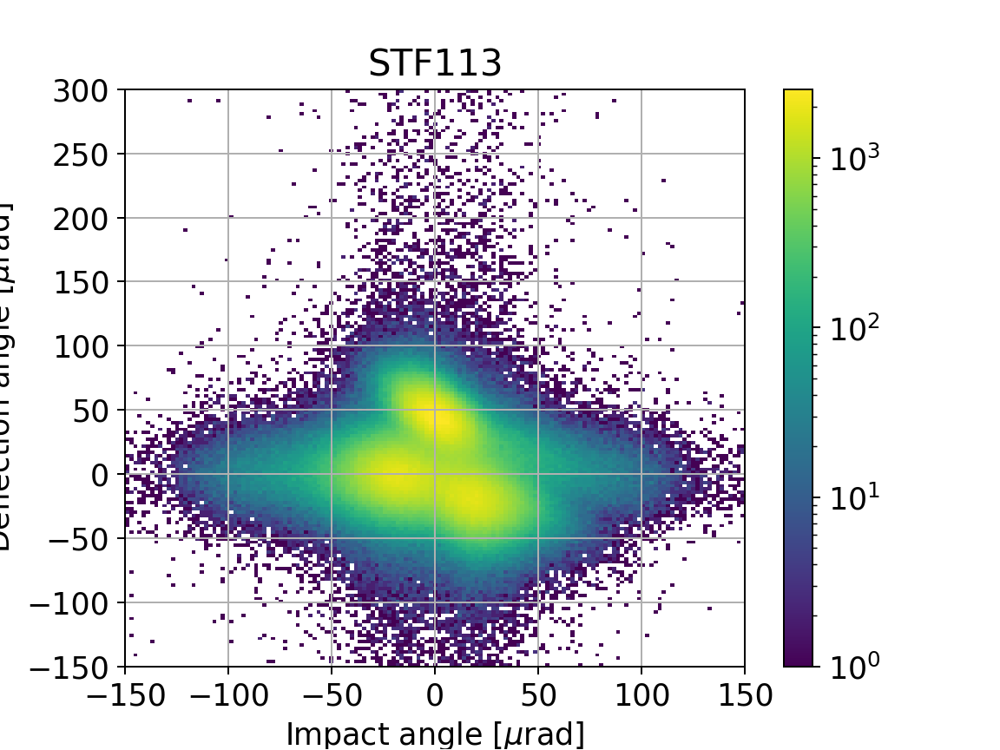

1646248.0


In [17]:
fig, ax = pl.subplots()

pl.xlabel(r'Impact angle [$\mu$rad]')
pl.ylabel(r'Deflection angle [$\mu$rad]')
pl.title('STF113')



xbins = np.linspace(-150, 150, 150)
ybins = np.linspace(-150, 300, 175)


counts, xedges, yedges, _ = pl.hist2d(data['thetaIn_corr'],data['defl_x'], bins=(xbins, ybins), 
                                       norm=mpl.colors.LogNorm(),
                                       cmap=pl.cm.viridis)
#pl.xlim(-150,150)
#pl.ylim(-150,150)

print (np.sum(counts))
cbar = pl.colorbar() 
pl.grid()   
pl.show()

In [18]:
#pl.savefig('acp82_pi_180gev_histat.png',format = 'png',dpi=300)

#### Angular cut on previous plot
##### basically tacking horizontal wedges from previous plot

##### for channeling: selection is made coherently with respect to critical angle (which is a function of particle beam energy)
##### half and one criticla angle cuts are used

In [19]:
################### Angular cut for efficiency analysis ######################

eff_crit = data.loc[(data['thetaIn_corr']>-crit_angle) & (data['thetaIn_corr']<crit_angle)]
eff_half = data.loc[(data['thetaIn_corr']>-crit_angle/2.) & (data['thetaIn_corr']<crit_angle/2.)]




# Change:
Before we had -2 < d0y < 1 change to: -1 < d0y < 1

/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78547/3612172288.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  torsion['thetaIn_corr'] = torsion['thetaIn_x'] + (t * torsion['d0_y'])


<IPython.core.display.Javascript object>


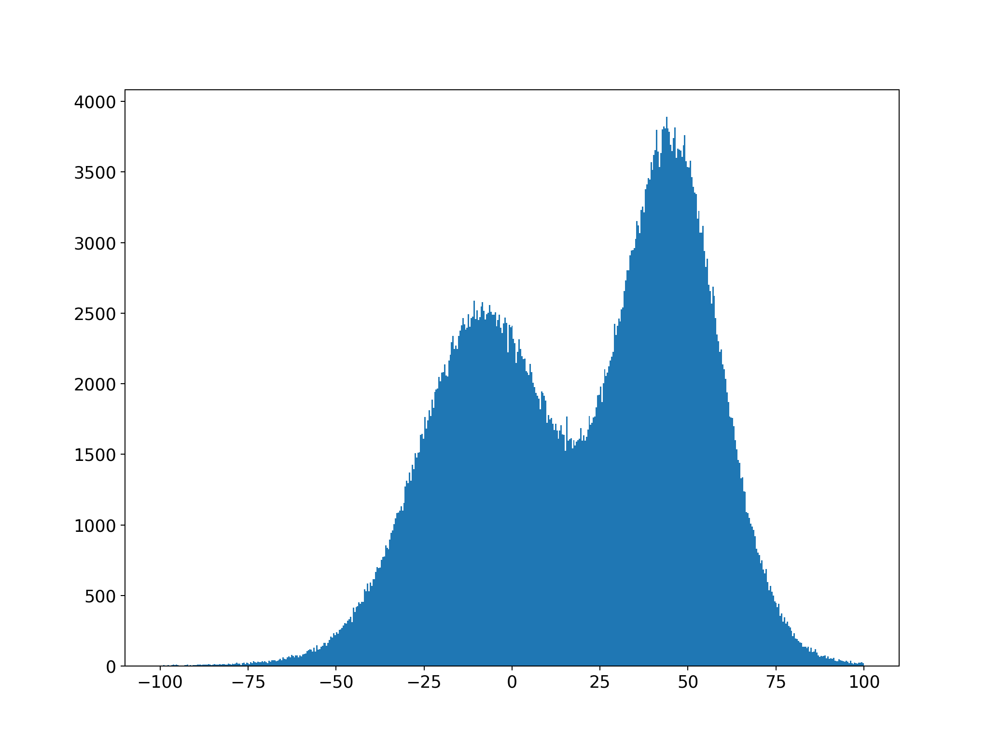

In [20]:
torsion = data_1.loc[(data_1['defl_x']>-100.) & (data_1['defl_x']<100.) &  (data_1['d0_y']<1) & (data_1['d0_y']>-1) & (data_1['d0_x']<1) & (data_1['d0_x']>-1)]
torsion['thetaIn_corr'] = torsion['thetaIn_x'] + (t * torsion['d0_y'])

eff_crit = data.loc[(torsion['thetaIn_corr']>-crit_angle) & (data['thetaIn_corr']<crit_angle)]
eff_half = data.loc[(torsion['thetaIn_corr']>-crit_angle/2.) & (data['thetaIn_corr']<crit_angle/2.)]

fig,ax = pl.subplots()
#pl.hist(data['thetaIn_corr'],1001)
pl.hist(eff_crit['defl_x'],501,log=False)

pl.xlim(-110,110)
pl.show()

<IPython.core.display.Javascript object>


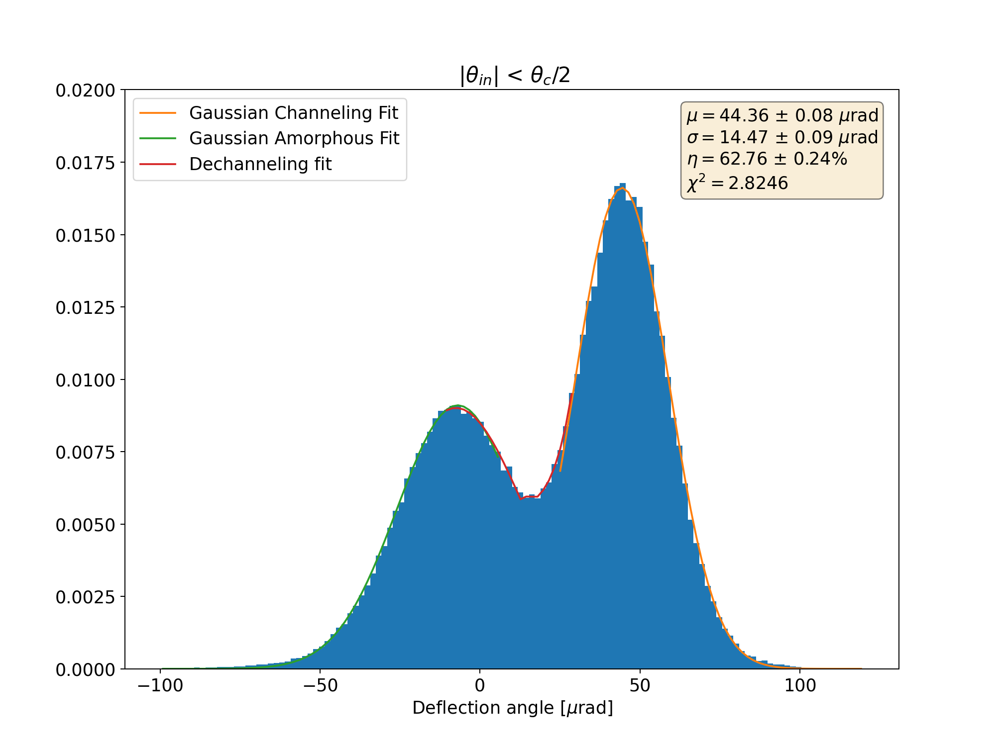

Initial bounds at AM = 11.38 and CH = 31.49

2.1360452341327765 0.0060000000082167226
Global fit
efficiency for full critical angle 60.56% $\pm$ 0.24%

Manual efficiency: 62.76%


In [50]:
############## analysis at half critiacl angle #############
############## initialise gaussian parameters  #############

half = np.array(eff_half['defl_x'])
#print(len(half))
fig, ax = pl.subplots()

pl.xlabel(r'Deflection angle [$\mu$rad]')
ax.set_title(r' |$\theta_{in}$| < $\theta_c$/2 ')



xmin, xmax = -100,120
lnspc = np.linspace(xmin, xmax, 125)

d_h, v_h, patch  = pl.hist(half,bins=lnspc,density=True,log=False)

c_h = (v_h[:-1] + v_h[1:]) / 2
param = (-9.,15.,0.008,44.,15.,0.016)
par_h, e_h = curve_fit(bimodal, c_h, d_h,param)#, bounds=((-np.inf, 10, -np.inf, 10), (np.inf, 30, np.inf, 30)))

#pl.plot(c_h[:],bimodal(c_h[:],*par_h),c='r')

#####GAUSSIAN 1
param_pl = (44.0,15.,0.0165)
par_h_pl, e_h_pl = curve_fit(gaussian, c_h[70:], d_h[70:],param_pl)
pl.plot(c_h[70:],gaussian(c_h[70:],*par_h_pl), label = 'Gaussian Channeling Fit')

#####GAUSSIAN 2
param_pl2 = (-8,18.,0.009)
par_h_pl2, e_h_pl2 = curve_fit(gaussian, c_h[:60], d_h[:60],param_pl2)
pl.plot(c_h[:60],gaussian(c_h[:60],*par_h_pl2), label = 'Gaussian Amorphous Fit')


mean_ch = par_h[3]
sigma_ch = par_h[4]
mean_am = par_h[0]
sigma_am = par_h[1]




############## adding dechanneling #################
dech_dw = mean_am+sigma_am*1
dech_up = mean_ch-sigma_ch*1
print('Initial bounds at AM = {:2.2f} and CH = {:2.2f}\n'.format(dech_dw,dech_up))

#fig, ax = plt.subplots()
#plt.hist(half,bins=lnspc,density=True,alpha=1,log=True)
pl.ylim(0,0.02)

#defl_cont(x,x_am,x_ch,mu1,sig1,A1,tau,A3,mu2,sig2,A2)

param_1 = (-20,45,-8.,10.,0.005,0.004,0.005,48,10.,0.005)
par_1h, pcov1h = curve_fit(defl_cont, c_h[50:73], d_h[50:73], 
                         bounds=((dech_dw-15,dech_up-15,mean_am-3, sigma_am-3, 0.006, 0.006, 0.006,mean_ch-3, sigma_ch-3, 0), 
                                 (dech_dw+15,dech_up+15,mean_am+3, sigma_am+3, 1, 20, 1e-2,mean_ch+3, sigma_ch+3, 1)))
print(par_1h[5],par_1h[6])
pl.plot(c_h[50:73],defl_cont(c_h[50:73],*par_1h),label='Dechanneling fit')


mean_ch_h = par_h_pl[0]
sigma_ch_h = par_h_pl[1]
mean_am_h = par_h_pl2[0]
sigma_am_h = par_h_pl2[1]

mean_ch_h_err = np.sqrt(np.diag(e_h_pl))[0]
sigma_ch_h_err = np.sqrt(np.diag(e_h_pl))[1]

print('Global fit')
#print(r'Amorphous gaussian $\mu$ = {:2.2f} and $\sigma$ = {:2.2f}'.format(par_1[2],par_1[3]))
#print(r'Channeling gaussian $\mu$ = {:2.2f} and $\sigma$ = {:2.2f}'.format(par_1[7],par_1[8]))

#dch_len_h = (par_1[5]*1e-6*(cry_length/(mean_ch_h*1e-6)))*1e3
#print(par_1[5],(cry_length/(mean_ch_h*1e-6)))
#print(r'Dechanneling Length $L_d$ = {:2.6f} mm'.format(dch_len_h))



###################### efficiency ###########################
sel_half = np.array(eff_half.loc[(eff_half['defl_x']>=mean_ch_h)])# & (eff_half['defl_x']<=(mean_ch_h+sigma_ch_h*8))]['defl_x'])
eff_h = (len(sel_half)*2)/len(eff_half)

sel_half_plus = np.array(eff_half.loc[(eff_half['defl_x']>=mean_ch_h+mean_ch_h_err) & (eff_half['defl_x']<=(mean_ch_h+mean_ch_h_err+(sigma_ch_h+sigma_ch_h_err)*3))]['defl_x'])
sel_half_minus = np.array(eff_half.loc[(eff_half['defl_x']>=mean_ch_h-mean_ch_h_err) & (eff_half['defl_x']<=(mean_ch_h-mean_ch_h_err+(sigma_ch_h-sigma_ch_h_err)*3))]['defl_x'])
eff_h_plus = (len(sel_half_plus)*2)/len(eff_half)
eff_h_minus = (len(sel_half_minus)*2)/len(eff_half)
eff_h_error = (eff_h_minus-eff_h_plus)/2.

ef_h = 2*sum(d_h[c_h>mean_ch_h])/sum(d_h)

print(r'efficiency for full critical angle {:2.2%} $\pm$ {:2.2%}'.format(eff_h,eff_h_error ))
print(f"\nManual efficiency: {ef_h*100:.2f}%")
#eff_h = eff_h*100
#eff_h_error *=100


chisq = sum((d_h-bimodal(c_h,*param))**2/bimodal(c_h,*param))
chisq = sum((d_h-bimodal(c_h,*param))**2/np.std(d_h)**2)
#chisq = sum((d_h-bimodal(c_h,*par_h))**2/bimodal(c_h,*par_h))
#chisq = sum((d_h-bimodal(c_h,*par_h))**2/np.std(d_h)**2)

#chisq = sum((d_h[70:]-gaussian(c_h[70:],*par_h_pl))**2/gaussian(c_h[70:],*par_h_pl))
#chisq = sum((d_h[70:]-gaussian(c_h[70:],*par_h_pl))**2/np.std(d_h[70:])**2)
#chisq = sum((d_h[70:]-gaussian(c_h[70:],*param_pl))**2/gaussian(c_h[70:],*param_pl))
#chisq = sum((d_h[70:]-gaussian(c_h[70:],*param_pl))**2/np.std(d_h[70:])**2)

textstr = '\n'.join((
    r'$\mu=%.2f$ $\pm$ %.2f $\mu$rad' % (mean_ch_h ,mean_ch_h_err, ),
    r'$\sigma=%.2f$ $\pm$ %.2f $\mu$rad' % (sigma_ch_h,sigma_ch_h_err,),
    #r'$\eta=%.2f$ $\pm$ %.2f ' % (eff_h,eff_h_error, )))
    r'$\eta={:2.2%}$ $\pm$ {:2.2%}'.format(ef_h,eff_h_error),
    r'$\chi^2=%.4f$' % (chisq)))

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.725, 0.97, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

ax.legend(loc='upper left')


In [22]:
mean_ch_h, mean_am_h

(44.35913252997263, -6.971270133362498)

In [23]:
mean_ch_h, param, par_h

(44.35913252997263,
 (-9.0, 15.0, 0.008, 44.0, 15.0, 0.016),
 array([-7.34993361e+00,  1.87286096e+01,  9.06755706e-03,  4.52576345e+01,
         1.37702883e+01,  1.64564811e-02]))

In [24]:
print(ef_h, eff_h)

0.6276148007114762 0.6056003707693464


<IPython.core.display.Javascript object>


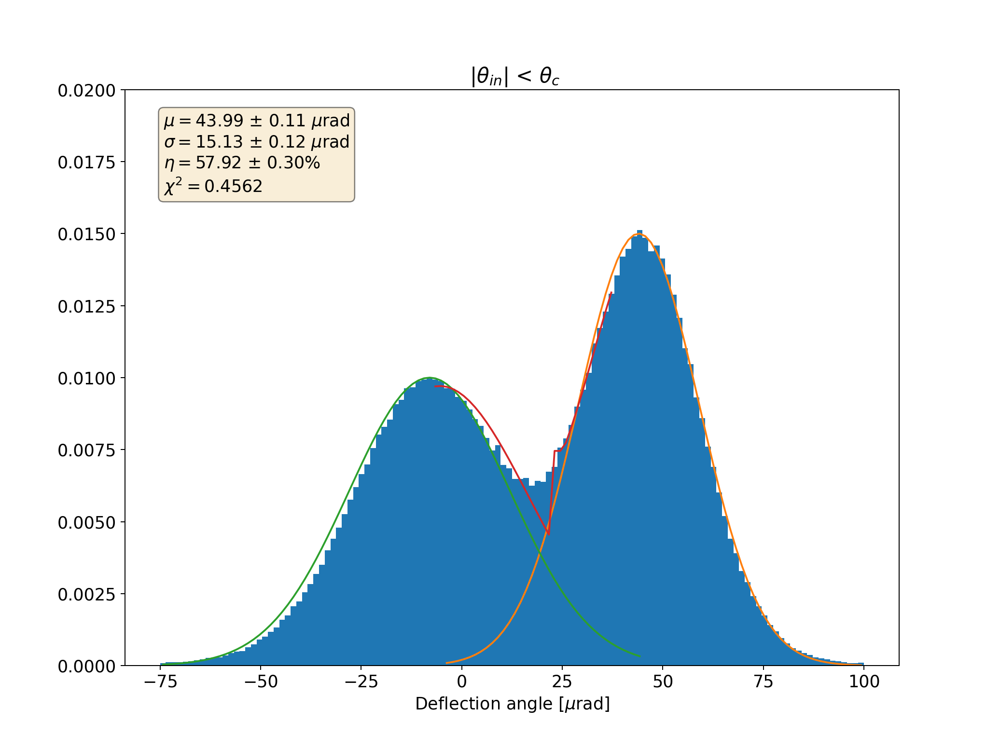

Initial bounds at AM = 11.39 and CH = 31.10

2.7926066971013066 0.006164881949965638
Global fit
Amorphous gaussian $\mu$ = -5.42 and $\sigma$ = 22.00
Channeling gaussian $\mu$ = 46.94 and $\sigma$ = 13.86
Dechanneling Length $L_d$ = 0.126960 mm
efficiency for full critical angle 56.49% $\pm$ 0.30%

Manual efficiency: 57.92%


Text(0.05, 0.96, '$\\mu=43.99$ $\\pm$ 0.11 $\\mu$rad\n$\\sigma=15.13$ $\\pm$ 0.12 $\\mu$rad\n$\\eta=57.92%$ $\\pm$ 0.30%\n$\\chi^2=0.4562$')

In [25]:
############## analysis at full critiacl angle #############
############## initialise gaussian parameters  #############

full = np.array(eff_crit['defl_x'])
#print(len(full))

fig, ax = pl.subplots()
pl.xlabel(r'Deflection angle [$\mu$rad]')

ax.set_title(r' |$\theta_{in}$| < $\theta_c$ ')



xmin, xmax = -75,100
lnspc = np.linspace(xmin, xmax, 125)

d_f, v_f, patch  = pl.hist(full,bins=lnspc,density=True,log=False, label='Normalised Data')#,weights=np.asarray(np.log(range(1,len(full)+1))))

c_f = (v_f[:-1] + v_f[1:]) / 2
param = (-8.,18.,0.010,45.,14.,0.0145)
par_f, e_f = curve_fit(bimodal, c_f[:], d_f[:],param)#, bounds=((-np.inf, 10, -np.inf, 10), (np.inf, 30, np.inf, 30)))

#pl.plot(c_f[:],bimodal(c_f[:],*param))


param_pl = (44.0,15.,0.015)
par_f_pl, e_f_pl = curve_fit(gaussian, c_f[70:], d_f[70:],param_pl)
pl.plot(c_f[50:],gaussian(c_f[50:],*param_pl), label = 'Gaussian Channeling Fit')

#####GAUSSIAN 2
param_pl2 = (-8.0,20.,0.010)
par_f_pl2, e_f_pl2 = curve_fit(gaussian, c_f[:60], d_f[:60],param_pl2)
pl.plot(c_f[:85],gaussian(c_f[:85],*param_pl2), label = 'Gaussian Amorph Fit')


mean_ch = par_f[3]
sigma_ch = par_f[4]
mean_am = par_f[0]
sigma_am = par_f[1]



############## adding dechanneling #################
dech_dw = mean_am+sigma_am*1
dech_up = mean_ch-sigma_ch*1
print('Initial bounds at AM = {:2.2f} and CH = {:2.2f}\n'.format(dech_dw,dech_up))

#fig, ax = plt.subplots()
#plt.hist(full,bins=lnspc,density=True,alpha=1,log=True)


param_1 = (-20,45,-8.,10.,0.005,0.004,0.005,48,10.,0.005)
par_1f, pcov1f = curve_fit(defl_cont, c_f[48:85], d_f[48:85], 
                         bounds=((dech_dw-15,dech_up-15,mean_am-3, sigma_am-3, 0.006, 0.006, 0.006,mean_ch-3, sigma_ch-3, 0), 
                                 (dech_dw+15,dech_up+15,mean_am+3, sigma_am+3, 1, 20, 1e-2,mean_ch+3, sigma_ch+3, 1)))
print(par_1f[5],par_1f[6])
pl.plot(c_f[48:80],defl_cont(c_f[48:80],*par_1f))

mean_ch_f = par_f_pl[0]
sigma_ch_f = par_f_pl[1]
mean_am_f = par_f_pl2[0]
sigma_am_f = par_f_pl2[1]

mean_ch_f_err = np.sqrt(np.diag(e_f_pl))[0]
sigma_ch_f_err = np.sqrt(np.diag(e_f_pl))[1]


print('Global fit')
print(r'Amorphous gaussian $\mu$ = {:2.2f} and $\sigma$ = {:2.2f}'.format(par_1f[2],par_1f[3]))
print(r'Channeling gaussian $\mu$ = {:2.2f} and $\sigma$ = {:2.2f}'.format(par_1f[7],par_1f[8]))

dch_len_f = (par_1f[5]*1e-6*(cry_length/(mean_ch_f*1e-6)))*1e3
#print(par_1[5],(cry_length/(mean_ch_f*1e-6)))
print(r'Dechanneling Length $L_d$ = {:2.6f} mm'.format(dch_len_f))

pl.ylim(0,0.02)
#pl.legend(loc='upper left')

###################### efficiency ###########################
sel_full = np.array(eff_crit.loc[(eff_crit['defl_x']>=mean_ch_f) & (eff_crit['defl_x']<=(mean_ch_f+sigma_ch_f*8))]['defl_x'])
eff_f = (len(sel_full)*2)/len(eff_crit)

sel_full_plus = np.array(eff_crit.loc[(eff_crit['defl_x']>=mean_ch_f+mean_ch_f_err) & (eff_crit['defl_x']<=(mean_ch_f+mean_ch_f_err+(sigma_ch_f+sigma_ch_f_err)*3))]['defl_x'])
sel_full_minus = np.array(eff_crit.loc[(eff_crit['defl_x']>=mean_ch_f-mean_ch_f_err) & (eff_crit['defl_x']<=(mean_ch_f-mean_ch_f_err+(sigma_ch_f-sigma_ch_f_err)*3))]['defl_x'])
eff_f_plus = (len(sel_full_plus)*2)/len(eff_crit)
eff_f_minus = (len(sel_full_minus)*2)/len(eff_crit)
eff_f_error = (eff_f_minus-eff_f_plus)/2.

ef_f = 2*sum(d_f[c_f>mean_ch_f])/sum(d_f)

print(r'efficiency for full critical angle {:2.2%} $\pm$ {:2.2%}'.format(eff_f,eff_f_error ))
print(f"\nManual efficiency: {ef_f*100:.2f}%")
#eff_f = eff_f*100
#eff_f_error *=100

Chisq = sum((d_f-bimodal(c_f,*param))**2/np.std(d_f)**2) #d_f because sigma = sqrt(counts) in each bin



textstr = '\n'.join((
    r'$\mu=%.2f$ $\pm$ %.2f $\mu$rad' % (mean_ch_f ,mean_ch_f_err, ),
    r'$\sigma=%.2f$ $\pm$ %.2f $\mu$rad' % (sigma_ch_f,sigma_ch_f_err,),
    #r'$\eta=%.2f$ $\pm$ %.2f ' % (eff_f,eff_f_error, )))
    r'$\eta={:2.2%}$ $\pm$ {:2.2%}'.format(ef_f,eff_f_error),
    r'$\chi^2=%.4f$' % (Chisq)))

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.96, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

In [26]:
param = (-8.,18.,0.010,45.,14.,0.0145)
sum((d_f[d_f>0]-bimodal(c_f[d_f>0],*param))**2/bimodal(c_f[d_f>0],*param)/d_f[d_f>0])

63.95875883345686

In [27]:
print(ef_f, eff_f)

0.5791970958719579 0.564908523488237


#### Angular cut on previous plot
##### now are selected the amorphous and the volume reflection regions

<IPython.core.display.Javascript object>


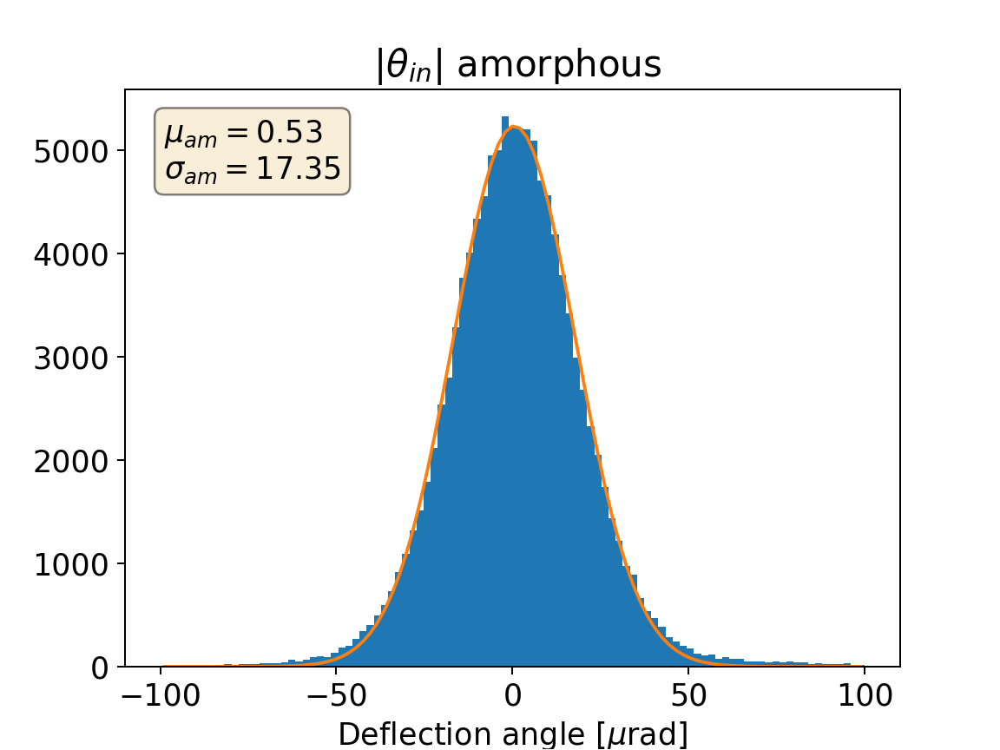

0.5331720957312626 17.352671397589965


Text(0.05, 0.95, '$\\mu_{am}=0.53$\n$\\sigma_{am}=17.35$')

In [28]:
am_df = data.loc[(data['thetaIn_corr']>-100.) & (data['thetaIn_corr']<-35)]

am = np.array(am_df['defl_x'])



fig, ax = pl.subplots()
pl.xlabel(r'Deflection angle [$\mu$rad]')
# plot normed histogram

ax.set_title(r' |$\theta_{in}$| amorphous ')

# find minimum and maximum of xticks, so we know
# where we should compute theoretical distribution
#xt = plt.xticks()[0]  
#xmin, xmax = min(half), max(half)  
xmin, xmax = -100,100
lnspc = np.linspace(xmin, xmax, 100)
#print(xmin,xmax)

#half = np.histogram(eff_half['KICK_REAL'],bins=100,range=(xmin,xmax))

#print(half)

dist, values, patch  = pl.hist(am,bins=lnspc)#,normed='True')
#print (len(dist), values, patch)
center = (values[:-1] + values[1:]) / 2
#print (center)
param = [0.,18.,25000]
popt, pcov = curve_fit(gaussian,center,dist,param)
#dgaus = np.(popt)

mean_am = popt[0]
sigma_am = popt[1]

print(mean_am,sigma_am)

#print(center)

pl.plot(center,gaussian(center,*popt))

textstr = '\n'.join((
    r'$\mu_{am}=%.2f$' % (mean_am , ),
    r'$\sigma_{am}=%.2f$' % (sigma_am, )))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)


[ -1.8681774  -66.55779486  -6.4055009  ... -32.18444724 -18.19815482
 -23.80329726]


<IPython.core.display.Javascript object>


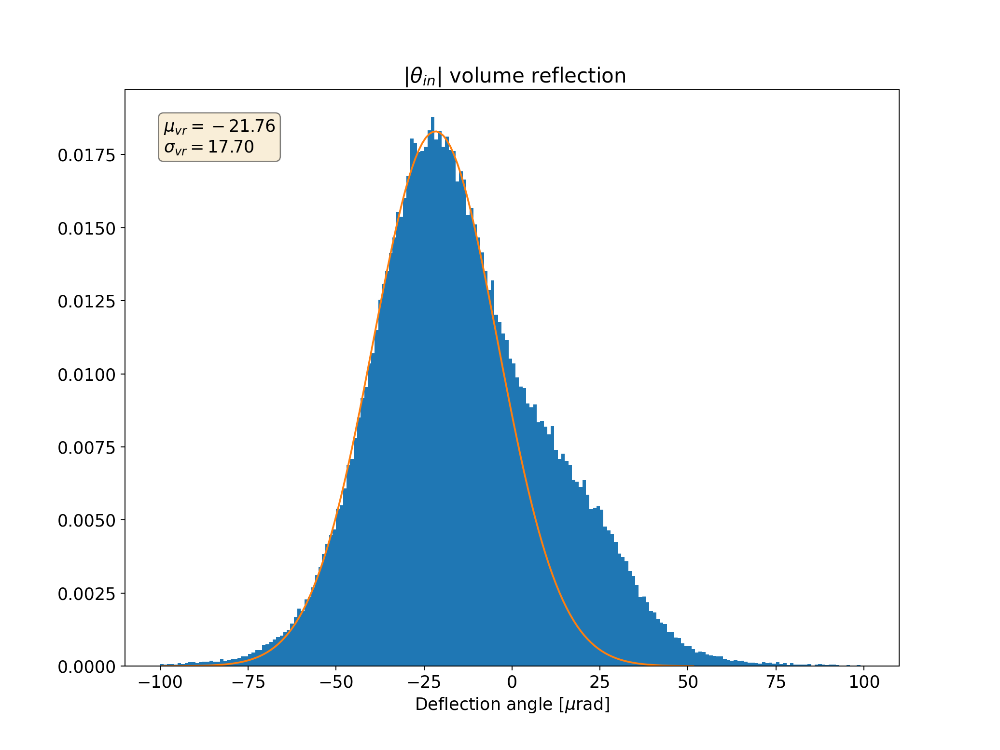

-21.76227973279299 17.699139174964944


Text(0.05, 0.95, '$\\mu_{vr}=-21.76$\n$\\sigma_{vr}=17.70$')

In [29]:
#vr_df = data.loc[(data['thetaIn_corr']>-45.) & (data['thetaIn_corr']<0.)]
vr_df = data.loc[(data['thetaIn_corr']>25.) & (data['thetaIn_corr']<100.)]# & (data['defl_x']>-80) & (data['defl_x']<10)]

vr = np.array(vr_df['defl_x'])

vr_sel = np.array(vr_df.loc[vr_df['defl_x']<=0.]['defl_x'])
print(vr_sel)

fig, ax = pl.subplots()
pl.xlabel(r'Deflection angle [$\mu$rad]')
# plot normed histogram

ax.set_title(r' |$\theta_{in}$| volume reflection ')

# find minimum and maximum of xticks, so we know
# where we should compute theoretical distribution
#xt = plt.xticks()[0]  
#xmin, xmax = min(half), max(half)  
xmin, xmax = -100,100
lnspc = np.linspace(xmin, xmax, 201)
#print(xmin,xmax)

#half = np.histogram(eff_half['KICK_REAL'],bins=100,range=(xmin,xmax))

#print(half)

dist, values, patch  = pl.hist(vr,bins=lnspc,density=True)

dist_sel = dist[:-48]
values_sel = values[:-48]


center = (values_sel[:-1] + values_sel[1:]) / 2
#print (center)
param = (-18,16.,0.0165)
popt, pcov = curve_fit(gaussian,center[center<-10],dist_sel[center<-10],param)
#dgaus = np.(popt)

mean_vr = popt[0]
sigma_vr = popt[1]

print(mean_vr,sigma_vr)

#print(center)

pl.plot(center,gaussian(center,*popt))

textstr = '\n'.join((
    r'$\mu_{vr}=%.2f$' % (mean_vr , ),
    r'$\sigma_{vr}=%.2f$' % (sigma_vr, )))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

In [30]:
#pl.savefig('acp82_pi_180gev_analysis_vr.png',format = 'png',dpi=300)

### saving data as built-in jupyter global variables 
##### can be imported in other notebook for comparison with other data 

In [31]:
acp82_half = np.copy(half)
acp82_half_ch_param = [mean_ch_h,sigma_ch_h,eff_h,dch_len_h]
acp82_full = np.copy(full)
acp82_full_ch_param = [mean_ch,sigma_ch,eff_f,dch_len_f]
acp82_am = np.copy(am)
acp82_am_param = [mean_am,sigma_am]
acp82_vr = np.copy(vr)
acp82_vr_param = [mean_vr,sigma_vr]



%store acp82_half
%store acp82_half_ch_param
%store acp82_full
%store acp82_full_ch_param
%store acp82_am_param
%store acp82_am
%store acp82_vr
%store acp82_vr_param







NameError: name 'dch_len_h' is not defined

In [ ]:
fig, ax = pl.subplots(figsize=(8,6))


binx = np.linspace(min(eff_crit['defl_x']),max(eff_crit['defl_x']),60)
biny = np.linspace(min(data_1['d0_y']),max(data_1['d0_y']),60)


hist,_,_ = np.histogram2d(data_1['defl_x'],data_1['d0_y'],bins=(binx,biny),);
hist_ch,_,_ = np.histogram2d(eff_crit['defl_x'],eff_crit['d0_y'],bins=(binx,biny),);


ratio  = np.divide(hist_ch.T, hist.T)

X, Y = np.meshgrid(binx,biny)
mesh = ax.pcolormesh(X, Y, (ratio))

cbar = pl.colorbar(mappable=mesh) 
#ax.axis('equal')
ax.set_xlabel('defl_x [mkr rad]')
ax.set_ylabel('Y Impact [mm]')
ax.set_ylim(-5,5)
ax.set_xlim(-150,150)



In [ ]:
ratio.shape